In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload the Excel file manually

import pandas as pd
df = pd.read_excel('cleaned_restaurant_data.xlsx')



Saving cleaned_restaurant_data.xlsx to cleaned_restaurant_data.xlsx


In [ ]:
df.head()

,name,city,rating,cuisine,link,address,item,order_date,sales_amount,month,year,age,gender,marital_status,occupation,month_num,pincode,state
0,AB FOODS POINT,Abohar,3.905141,"Beverages,Pizzas",https://www.swiggy.com/restaurants/ab-foods-po...,"AB FOODS POINT, NEAR RISHI NARANG DENTAL CLINI...",Aloo Tikki Burger,2017-10-10,41241,October,2017,20,Female,Single,Student,10,NaN,NaN
1,Janta Sweet House,Abohar,4.400000,"Sweets,Bakery",https://www.swiggy.com/restaurants/janta-sweet...,"Janta Sweet House, Bazar No.9, Circullar Road,...",Veg Creamy Burger,2018-05-08,2100,May,2018,24,Female,Single,Student,5,NaN,NaN
2,theka coffee desi,Abohar,3.800000,Beverages,https://www.swiggy.com/restaurants/theka-coffe...,"theka coffee desi, sahtiya sadan road city",Cheese Burst Burger,2018-04-06,875,April,2018,22,Male,Single,Student,4,NaN,NaN
3,Singh Hut,Abohar,3.700000,"Fast Food,Indian",https://www.swiggy.com/restaurants/singh-hut-n...,"Singh Hut, CIRCULAR ROAD NEAR NEHRU PARK ABOHAR",Paneer Creamy Burger,2018-04-11,583,April,2018,22,Female,Single,Student,4,NaN,NaN
4,GRILL MASTERS,Abohar,3.905141,"Italian-American,Fast Food",https://www.swiggy.com/restaurants/grill-maste...,"GRILL MASTERS, ADA Heights, Abohar - Hanumanga...",Maxican Burger,2018-06-18,7176,June,2018,22,Male,Single,Student,6,152116.0,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   name            100000 non-null  object        
 1   city            100000 non-null  object        
 2   rating          100000 non-null  float64       
 3   cuisine         100000 non-null  object        
 4   link            100000 non-null  object        
 5   address         100000 non-null  object        
 6   item            100000 non-null  object        
 7   order_date      100000 non-null  datetime64[ns]
 8   sales_amount    100000 non-null  int64         
 9   month           100000 non-null  object        
 10  year            100000 non-null  int64         
 11  age             100000 non-null  int64         
 12  gender          100000 non-null  object        
 13  marital_status  100000 non-null  object        
 14  occupation      100000 non-null  obje

In [ ]:
df.describe()

,rating,order_date,sales_amount,year,age,month_num,pincode
count,100000.000000,100000,1.000000e+05,100000.000000,100000.000000,100000.000000,66489.000000
mean,3.905141,2019-01-10 19:37:41.375999744,5.189359e+03,2018.542370,24.628580,6.349980,439368.218051
min,1.000000,2017-10-04 00:00:00,-1.000000e+00,2017.000000,18.000000,1.000000,90.000000
25%,3.905141,2018-05-14 00:00:00,1.710000e+02,2018.000000,23.000000,3.000000,201012.000000
50%,3.905141,2018-12-24 00:00:00,5.190000e+02,2018.000000,24.000000,6.000000,500081.000000
75%,3.905141,2019-09-03 00:00:00,2.847000e+03,2019.000000,26.000000,10.000000,600040.000000
max,5.000000,2020-06-26 00:00:00,1.510944e+06,2020.000000,33.000000,12.000000,999999.000000
std,0.298394,NaN,2.284853e+04,0.854513,2.971743,3.552354,217668.480567


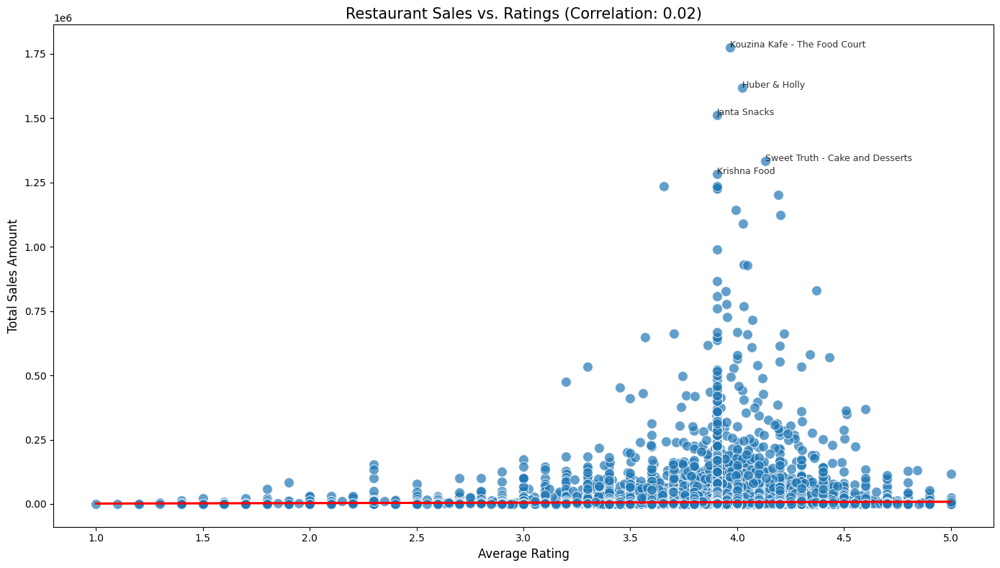

Top 10 Restaurants by Sales Volume:
                                  name  sales_amount    rating
36040    Kouzina Kafe - The Food Court       1774735  3.966089
30124                    Huber & Holly       1618439  4.025000
32397                     Janta Snacks       1510944  3.905141
63936  Sweet Truth - Cake and Desserts       1332118  4.131358
36161                     Krishna Food       1284102  3.905141
50312                        Pizza Hut       1236502  3.655933
74775                     ZAATAR SPICE       1235347  3.905141
47115          Odeon Gupta Paan Palace       1228148  3.905141
11623                       CHAI THELA       1224144  3.905141
19754                   Domino's Pizza       1201303  4.192416


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Group by restaurant and calculate metrics
restaurant_performance = df.groupby('name').agg({
    'sales_amount': 'sum',
    'rating': 'mean'
}).reset_index()

# Sort by total sales
top_restaurants = restaurant_performance.sort_values('sales_amount', ascending=False).head(15)

# Correlation between rating and sales
correlation = restaurant_performance['sales_amount'].corr(restaurant_performance['rating'])

# Plotting
plt.figure(figsize=(14, 8))
sns.scatterplot(data=restaurant_performance, x='rating', y='sales_amount',
                s=100, alpha=0.7)

# Regression line
sns.regplot(data=restaurant_performance, x='rating', y='sales_amount',
            scatter=False, color='red')

plt.title(f'Restaurant Sales vs. Ratings (Correlation: {correlation:.2f})', fontsize=15)
plt.xlabel('Average Rating', fontsize=12)
plt.ylabel('Total Sales Amount', fontsize=12)

# Annotate top 5 restaurants
for i, row in top_restaurants.head().iterrows():
    plt.annotate(row['name'], (row['rating'], row['sales_amount']),
                 fontsize=9, alpha=0.8)

plt.tight_layout()
plt.show()

# Top 10 printout
print("Top 10 Restaurants by Sales Volume:")
print(top_restaurants.head(10)[['name', 'sales_amount', 'rating']])


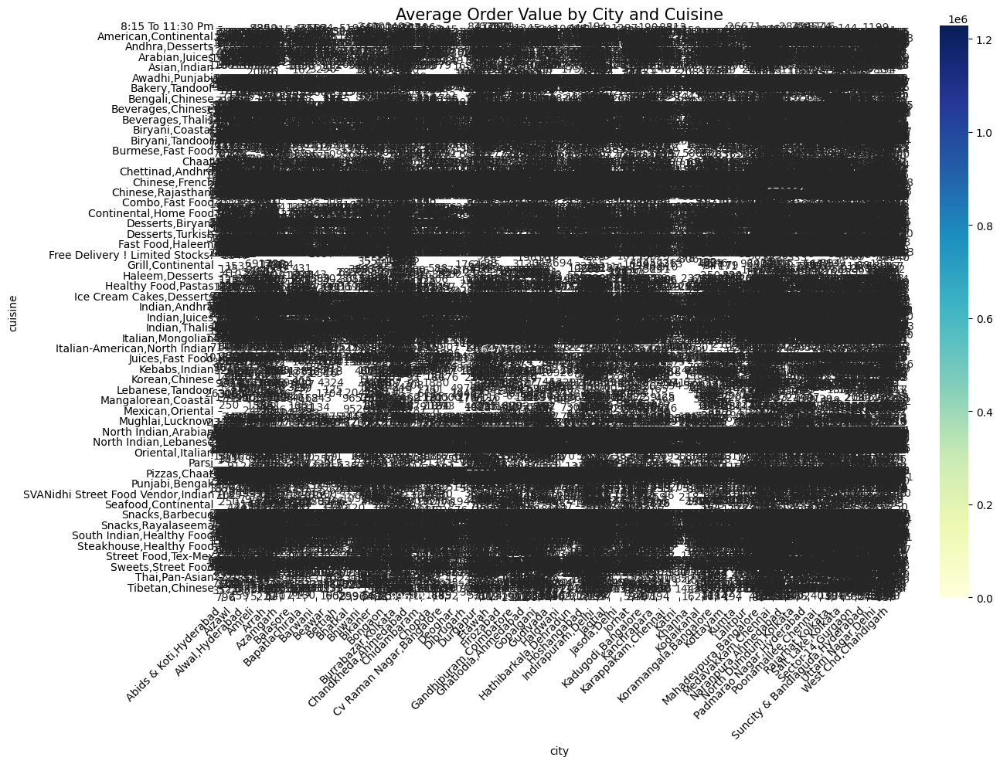

Top 10 City-Cuisine Combinations by Average Order Value:
                            city                  cuisine  average_order_value
11140      Connaught Place,Delhi                 Desserts         1.228148e+06
9793        Chandkheda,Ahmedabad          Waffle,Desserts         9.961020e+05
31539      Navrangpura,Ahmedabad           Chinese,Pizzas         9.701300e+05
15839        Ghatlodia,Ahmedabad                   Sweets         9.701300e+05
13473  Electronic City,Bangalore           Pizzas,Chinese         7.602550e+05
15739        Ghatlodia,Ahmedabad            Chinese,Combo         6.593800e+05
14206                   Fatehpur  Italian-American,Snacks         6.477780e+05
31665      Navrangpura,Ahmedabad       Street Food,Indian         5.218053e+05
15801        Ghatlodia,Ahmedabad     North Indian,Punjabi         4.768982e+05
15401                       Gaya          Chinese,Italian         4.737590e+05

Bottom 10 City-Cuisine Combinations by Average Order Value:
             

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Calculate AOV by city and cuisine
aov_by_city_cuisine = df.groupby(['city', 'cuisine'])['sales_amount'].mean().reset_index()
aov_by_city_cuisine.rename(columns={'sales_amount': 'average_order_value'}, inplace=True)

# Step 2: Calculate overall AOV for each city
city_avg = df.groupby('city')['sales_amount'].mean().reset_index()
city_avg.rename(columns={'sales_amount': 'city_average'}, inplace=True)

# Step 3: Merge AOV with city averages
aov_analysis = pd.merge(aov_by_city_cuisine, city_avg, on='city')

# Step 4: Calculate % difference from city average
aov_analysis['pct_diff_from_city_avg'] = (
    (aov_analysis['average_order_value'] - aov_analysis['city_average']) /
    aov_analysis['city_average'] * 100
)

# Step 5: Visualization - Heatmap
pivot_table = aov_by_city_cuisine.pivot(index='cuisine', columns='city', values='average_order_value')

plt.figure(figsize=(14, 10))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.0f', linewidths=0.5)
plt.title('Average Order Value by City and Cuisine', fontsize=15)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Step 6: Print top and bottom AOV combinations
print("Top 10 City-Cuisine Combinations by Average Order Value:")
print(aov_by_city_cuisine.sort_values('average_order_value', ascending=False).head(10))

print("\nBottom 10 City-Cuisine Combinations by Average Order Value:")
print(aov_by_city_cuisine.sort_values('average_order_value').head(10))

# Step 7: Cuisine consistency analysis
cuisine_consistency = aov_analysis.groupby('cuisine')['pct_diff_from_city_avg'].agg(['mean', 'std'])

print("\nCuisines with Consistently Higher Order Values Across Cities:")
print(cuisine_consistency[cuisine_consistency['mean'] > 0].sort_values('std').head(10))


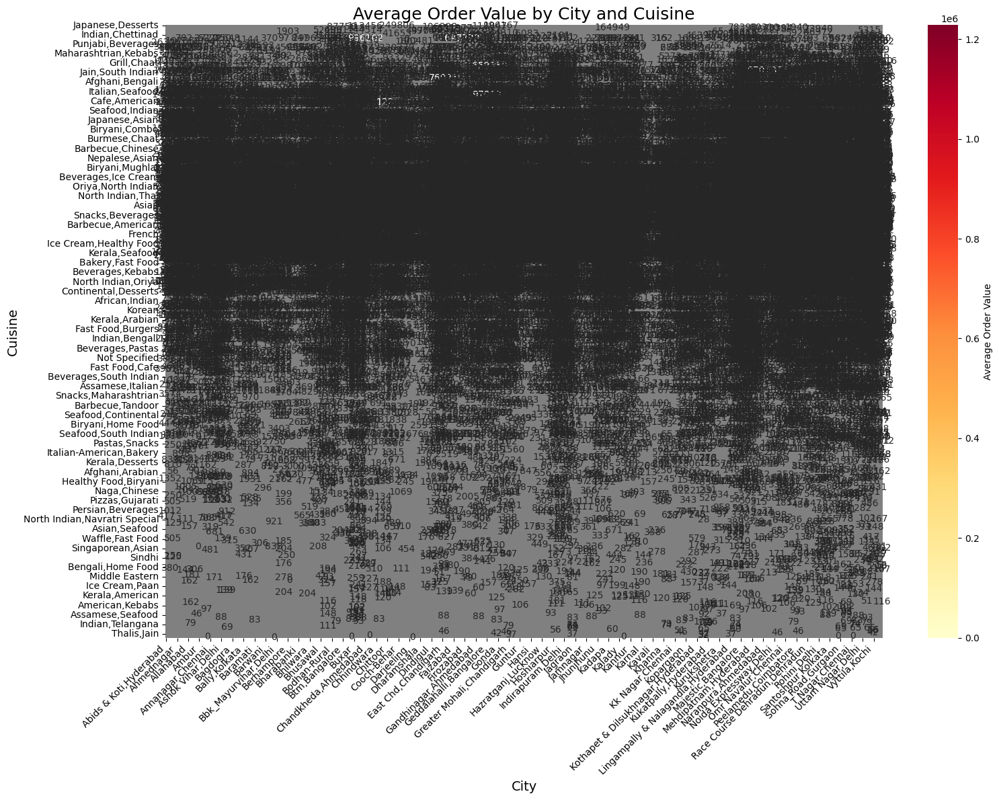

In [ ]:
# Pivot table for heatmap
pivot_table = aov_by_city_cuisine.pivot(index='cuisine', columns='city', values='average_order_value')

# Optional: sort cuisines by their overall average order value
sorted_cuisines = pivot_table.mean(axis=1).sort_values(ascending=False).index
pivot_table = pivot_table.loc[sorted_cuisines]

plt.figure(figsize=(16, 12))
sns.heatmap(
    pivot_table,
    annot=True,
    fmt='.0f',  # Format without decimals
    cmap='YlOrRd',  # More contrast than YlGnBu
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Average Order Value'}
)

plt.title('Average Order Value by City and Cuisine', fontsize=18)
plt.xlabel('City', fontsize=14)
plt.ylabel('Cuisine', fontsize=14)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


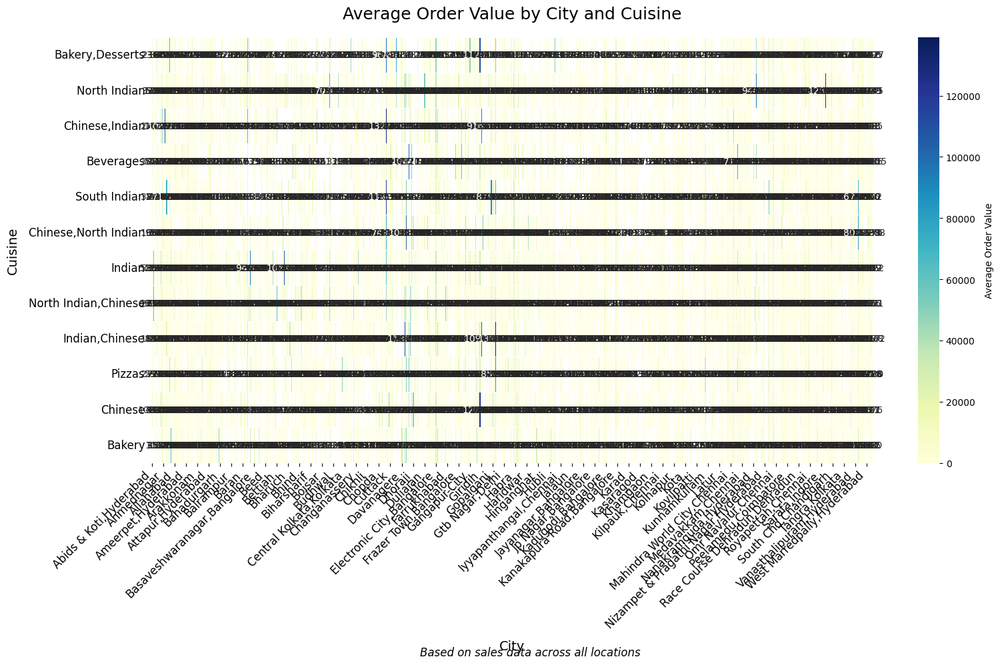

<ipython-input-15-c10756737525>:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='pct_diff_from_city_avg', y='combo', data=top_diff, palette='viridis')


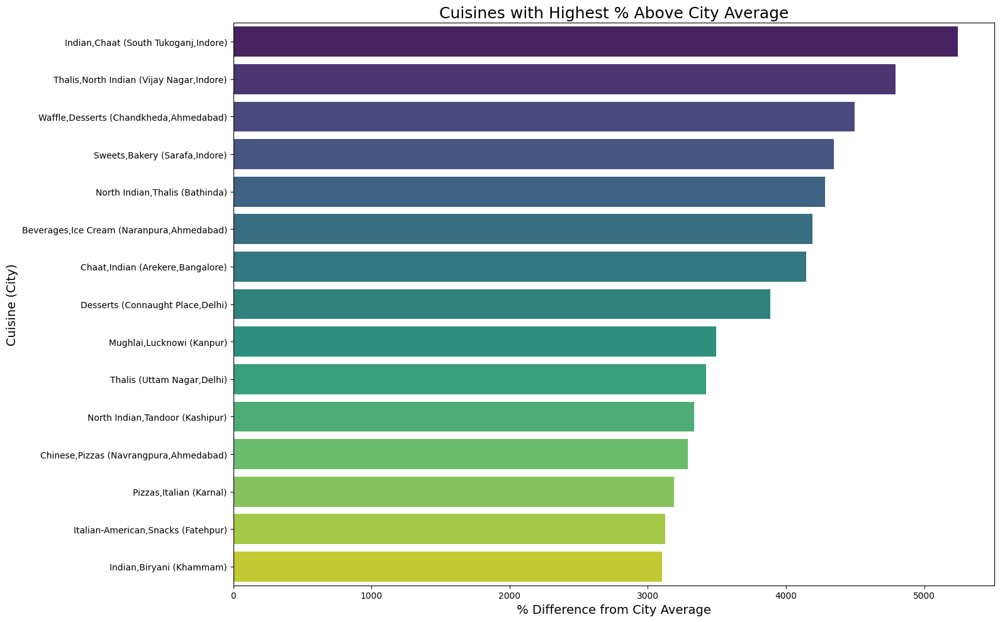

Top 10 City-Cuisine Combinations by Average Order Value:
                            city                  cuisine  average_order_value
11140      Connaught Place,Delhi                 Desserts         1.228148e+06
9793        Chandkheda,Ahmedabad          Waffle,Desserts         9.961020e+05
31539      Navrangpura,Ahmedabad           Chinese,Pizzas         9.701300e+05
15839        Ghatlodia,Ahmedabad                   Sweets         9.701300e+05
13473  Electronic City,Bangalore           Pizzas,Chinese         7.602550e+05
15739        Ghatlodia,Ahmedabad            Chinese,Combo         6.593800e+05
14206                   Fatehpur  Italian-American,Snacks         6.477780e+05
31665      Navrangpura,Ahmedabad       Street Food,Indian         5.218053e+05
15801        Ghatlodia,Ahmedabad     North Indian,Punjabi         4.768982e+05
15401                       Gaya          Chinese,Italian         4.737590e+05

Bottom 10 City-Cuisine Combinations by Average Order Value:
             

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Your data processing steps remain the same
# Step 1: Calculate AOV by city and cuisine
aov_by_city_cuisine = df.groupby(['city', 'cuisine'])['sales_amount'].mean().reset_index()
aov_by_city_cuisine.rename(columns={'sales_amount': 'average_order_value'}, inplace=True)

# Step 2: Calculate overall AOV for each city
city_avg = df.groupby('city')['sales_amount'].mean().reset_index()
city_avg.rename(columns={'sales_amount': 'city_average'}, inplace=True)

# Step 3: Merge AOV with city averages
aov_analysis = pd.merge(aov_by_city_cuisine, city_avg, on='city')

# Step 4: Calculate % difference from city average
aov_analysis['pct_diff_from_city_avg'] = (
    (aov_analysis['average_order_value'] - aov_analysis['city_average']) /
    aov_analysis['city_average'] * 100
)

# Improved visualization approach
# Step 5: Create a more readable heatmap
# Filter for the most common cuisines to reduce clutter (adjust the number as needed)
cuisine_counts = df['cuisine'].value_counts()
top_cuisines = cuisine_counts.nlargest(12).index.tolist()

# Filter the data for top cuisines
filtered_data = aov_by_city_cuisine[aov_by_city_cuisine['cuisine'].isin(top_cuisines)]

# Create the pivot table with the filtered data
pivot_table = filtered_data.pivot(index='cuisine', columns='city', values='average_order_value')

# Sort the cuisines by their average AOV for better readability
cuisine_avg_aov = filtered_data.groupby('cuisine')['average_order_value'].mean().sort_values(ascending=False)
pivot_table = pivot_table.reindex(cuisine_avg_aov.index)

# Create a better heatmap
plt.figure(figsize=(16, 10))
ax = sns.heatmap(
    pivot_table,
    annot=True,
    cmap='YlGnBu',
    fmt='.0f',  # No decimal places for cleaner view
    linewidths=0.5,
    cbar_kws={'label': 'Average Order Value'}
)

# Improve the appearance
plt.title('Average Order Value by City and Cuisine', fontsize=18, pad=20)
plt.xlabel('City', fontsize=14, labelpad=10)
plt.ylabel('Cuisine', fontsize=14, labelpad=10)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Add a subtitle with context
plt.figtext(0.5, 0.01, 'Based on sales data across all locations',
            ha='center', fontsize=12, style='italic')

# Ensure everything fits nicely
plt.tight_layout()

# Show the visualization
plt.show()

# For additional insights, create a bar chart showing percent difference from city average
plt.figure(figsize=(16, 10))

# Get top 10 cuisine-city combinations with highest % difference from city average
top_diff = aov_analysis.sort_values('pct_diff_from_city_avg', ascending=False).head(15)
top_diff['combo'] = top_diff['cuisine'] + ' (' + top_diff['city'] + ')'

# Create the bar chart
sns.barplot(x='pct_diff_from_city_avg', y='combo', data=top_diff, palette='viridis')
plt.title('Cuisines with Highest % Above City Average', fontsize=18)
plt.xlabel('% Difference from City Average', fontsize=14)
plt.ylabel('Cuisine (City)', fontsize=14)
plt.axvline(x=0, color='red', linestyle='--')
plt.tight_layout()
plt.show()

# Print key findings
print("Top 10 City-Cuisine Combinations by Average Order Value:")
print(aov_by_city_cuisine.sort_values('average_order_value', ascending=False).head(10))

print("\nBottom 10 City-Cuisine Combinations by Average Order Value:")
print(aov_by_city_cuisine.sort_values('average_order_value').head(10))

# Cuisine consistency analysis
cuisine_consistency = aov_analysis.groupby('cuisine')['pct_diff_from_city_avg'].agg(['mean', 'std'])
cuisine_consistency = cuisine_consistency[cuisine_consistency.index.isin(df['cuisine'].value_counts()[df['cuisine'].value_counts() > 5].index)]

print("\nCuisines with Consistently Higher Order Values Across Cities:")
print(cuisine_consistency[cuisine_consistency['mean'] > 0].sort_values('std').head(10))

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract neighborhood from address (assuming format like "Area, City")
df['neighborhood'] = df['address'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) and ',' in x else 'Unknown')

# Calculate key metrics by neighborhood
neighborhood_performance = df.groupby(['city', 'neighborhood']).agg({
    'sales_amount': ['sum', 'mean'],  # Total sales and average order value
    'order_date': 'count',  # Order count
    'name': 'nunique',  # Number of restaurants
    'rating': 'mean'  # Average rating
}).reset_index()

# Flatten the multi-level columns
neighborhood_performance.columns = ['_'.join(col).strip('_') for col in neighborhood_performance.columns.values]

# Rename for clarity
neighborhood_performance.rename(columns={
    'sales_amount_sum': 'total_sales',
    'sales_amount_mean': 'average_order_value',
    'order_date_count': 'order_count',
    'name_nunique': 'restaurant_count',
    'rating_mean': 'average_rating'
}, inplace=True)

# Calculate sales per restaurant and orders per restaurant
neighborhood_performance['sales_per_restaurant'] = (neighborhood_performance['total_sales'] /
                                                  neighborhood_performance['restaurant_count'])
neighborhood_performance['orders_per_restaurant'] = (neighborhood_performance['order_count'] /
                                                   neighborhood_performance['restaurant_count'])

# Filter to neighborhoods with meaningful number of restaurants
min_restaurants = 3
significant_neighborhoods = neighborhood_performance[neighborhood_performance['restaurant_count'] >= min_restaurants]

# Sort significant neighborhoods by sales per restaurant within each city
top_neighborhoods = significant_neighborhoods.sort_values(['city', 'sales_per_restaurant'],
                                                         ascending=[True, False])

# Get unique cities and handle the case if there are too many
unique_cities = significant_neighborhoods['city'].unique()
cities_to_plot = unique_cities[:min(6, len(unique_cities))]  # Maximum 6 cities

# Calculate grid dimensions
n_cities = len(cities_to_plot)
n_cols = min(3, n_cities)
n_rows = (n_cities + n_cols - 1) // n_cols  # Ceiling division

# Create figure with appropriate size
plt.figure(figsize=(18, 4 * n_rows))

# Create subplots for each city
for i, city in enumerate(cities_to_plot):
    # Get data for current city
    city_data = significant_neighborhoods[significant_neighborhoods['city'] == city].sort_values(
        'sales_per_restaurant', ascending=False).head(8)  # Top 8 neighborhoods

    # Create subplot
    plt.subplot(n_rows, n_cols, i+1)

    # Create horizontal bar chart for better readability
    ax = sns.barplot(y='neighborhood', x='sales_per_restaurant', data=city_data, palette='viridis')

    # Add value labels to bars
    for j, bar in enumerate(ax.patches):
        width = bar.get_width()
        formatted_value = f"₹{width:,.0f}"
        ax.text(width + (width * 0.02), bar.get_y() + bar.get_height()/2,
                formatted_value, ha='left', va='center')

    # Set title and labels
    plt.title(f'Top Neighborhoods in {city}', fontsize=14, fontweight='bold')
    plt.xlabel('Sales per Restaurant (₹)', fontsize=12)
    plt.ylabel('')

    # Set x-axis limit to make room for labels
    plt.xlim(0, city_data['sales_per_restaurant'].max() * 1.25)

    # Add grid lines for better readability
    plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.suptitle('Top Performing Neighborhoods by Sales per Restaurant', fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for the suptitle
plt.savefig('neighborhood_performance.png')  # Save figure in case display doesn't work
plt.close()  # Close the figure

# Find city with most neighborhoods for correlation analysis
city_counts = significant_neighborhoods['city'].value_counts()
main_city = city_counts.index[0] if not city_counts.empty else None

if main_city:
    # Create correlation matrix for neighborhood metrics
    neighborhood_metrics = significant_neighborhoods[significant_neighborhoods['city'] == main_city][
        ['sales_per_restaurant', 'average_order_value', 'orders_per_restaurant', 'average_rating']]

    if not neighborhood_metrics.empty:
        plt.figure(figsize=(10, 8))
        correlation_matrix = neighborhood_metrics.corr()
        mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))  # Create mask for upper triangle

        # Create improved heatmap
        sns.heatmap(correlation_matrix,
                   annot=True,           # Show values
                   fmt='.2f',            # Format to 2 decimal places
                   cmap='coolwarm',      # Red-blue colormap
                   mask=mask,            # Only show lower triangle
                   linewidths=0.5,
                   cbar_kws={'label': 'Correlation Coefficient'})

        plt.title(f'Correlation Between Performance Metrics in {main_city}', fontsize=15)
        plt.tight_layout()
        plt.savefig('neighborhood_correlation.png')  # Save figure in case display doesn't work
        plt.close()  # Close the figure

# Create a scatter plot showing relationship between metrics
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(
    data=significant_neighborhoods,
    x='average_order_value',
    y='orders_per_restaurant',
    size='restaurant_count',
    hue='city',
    sizes=(20, 200),
    alpha=0.7
)

# Annotate points for top performing neighborhoods
top_points = significant_neighborhoods.sort_values('sales_per_restaurant', ascending=False).head(10)
for idx, row in top_points.iterrows():
    plt.annotate(
        row['neighborhood'],
        (row['average_order_value'], row['orders_per_restaurant']),
        xytext=(5, 5),
        textcoords='offset points',
        fontsize=8,
        bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.3)
    )

plt.title('Neighborhood Performance: Order Volume vs. Average Order Value', fontsize=15)
plt.xlabel('Average Order Value (₹)', fontsize=12)
plt.ylabel('Orders per Restaurant', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('neighborhood_scatter.png')  # Save figure in case display doesn't work
plt.close()  # Close the figure

# Print top performing neighborhoods by city
print("Top Performing Neighborhoods by City (Sales per Restaurant):")
for city in top_neighborhoods['city'].unique():
    print(f"\n{city}:")
    city_data = top_neighborhoods[top_neighborhoods['city'] == city].head(5)
    for i, row in city_data.iterrows():
        print(f"  {row['neighborhood']}: ₹{row['sales_per_restaurant']:,.0f} " +
              f"({row['restaurant_count']} restaurants, {row['average_rating']:.1f} avg rating)")

# Calculate additional neighborhood insights
print("\nNeighborhoods with Highest Average Ratings (min 3 restaurants):")
top_rated = significant_neighborhoods.sort_values('average_rating', ascending=False).head(10)
for i, row in top_rated.iterrows():
    print(f"  {row['neighborhood']} ({row['city']}): {row['average_rating']:.2f}/5 " +
          f"({row['restaurant_count']} restaurants)")

print("\nNeighborhoods with Highest Order Volume per Restaurant:")
highest_volume = significant_neighborhoods.sort_values('orders_per_restaurant', ascending=False).head(10)
for i, row in highest_volume.iterrows():
    print(f"  {row['neighborhood']} ({row['city']}): {row['orders_per_restaurant']:.1f} orders/restaurant" +
          f" (₹{row['average_order_value']:,.0f} avg order)")

# Return summary table of metrics for all significant neighborhoods
summary_table = significant_neighborhoods[['city', 'neighborhood', 'restaurant_count',
                                         'sales_per_restaurant', 'orders_per_restaurant',
                                         'average_order_value', 'average_rating']]
summary_table = summary_table.sort_values(['city', 'sales_per_restaurant'], ascending=[True, False])
# Format numeric columns for display
summary_table['sales_per_restaurant'] = summary_table['sales_per_restaurant'].map('₹{:,.0f}'.format)
summary_table['average_order_value'] = summary_table['average_order_value'].map('₹{:,.0f}'.format)
summary_table['average_rating'] = summary_table['average_rating'].map('{:.1f}'.format)
summary_table['orders_per_restaurant'] = summary_table['orders_per_restaurant'].map('{:.1f}'.format)

print("\nDetailed Neighborhood Performance Summary:")
print(summary_table.head(20).to_string(index=False))

ZeroDivisionError: integer division or modulo by zero

<ipython-input-18-285773d2478e>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='neighborhood', x='sales_per_restaurant', data=city_data, palette='viridis')
<ipython-input-18-285773d2478e>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='neighborhood', x='sales_per_restaurant', data=city_data, palette='viridis')
<ipython-input-18-285773d2478e>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y='neighborhood', x='sales_per_restaurant', data=city_data, palette='viridis')
<ipython-input-18-285773d2478e>:83: FutureWarning

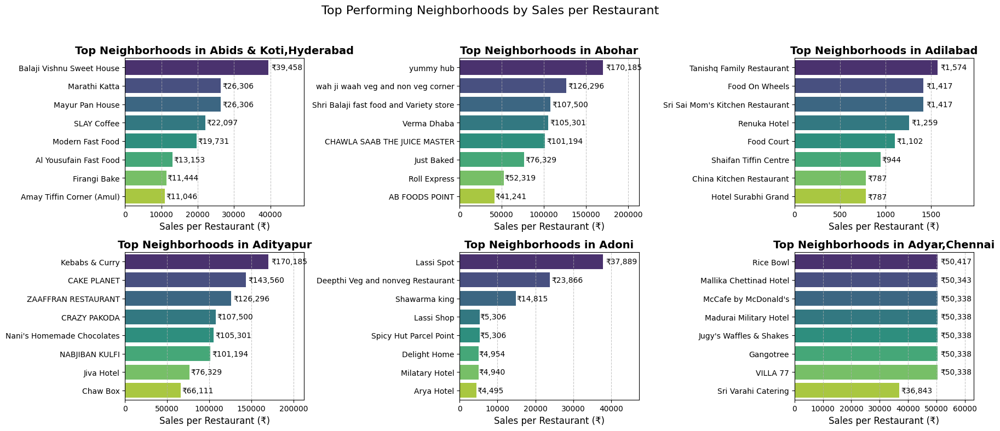

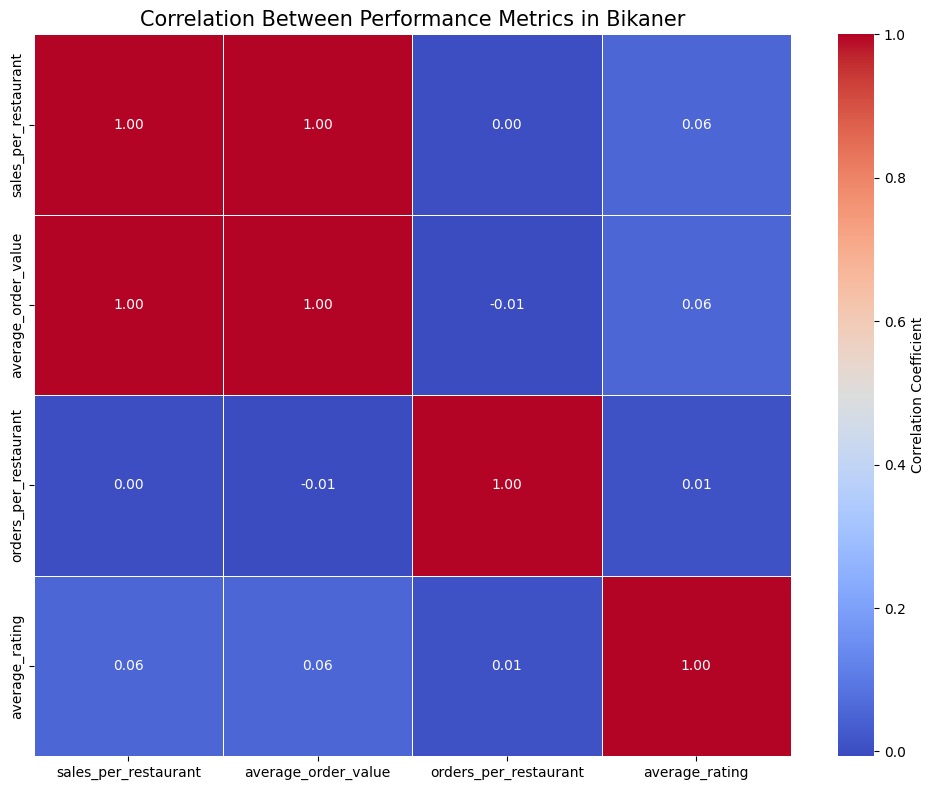

<ipython-input-18-285773d2478e>:168: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


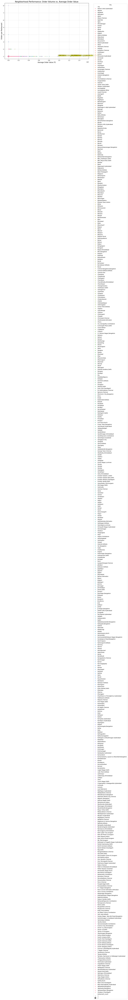

Top Performing Neighborhoods by City (Sales per Restaurant):

Abids & Koti,Hyderabad:
  Balaji Vishnu Sweet House: ₹39,458 (1 restaurants, 3.9 avg rating)
  Marathi Katta: ₹26,306 (1 restaurants, 4.1 avg rating)
  Mayur Pan House: ₹26,306 (1 restaurants, 4.2 avg rating)
  SLAY Coffee: ₹22,097 (1 restaurants, 4.1 avg rating)
  Modern Fast Food: ₹19,731 (1 restaurants, 3.9 avg rating)

Abohar:
  yummy hub: ₹170,185 (1 restaurants, 3.9 avg rating)
  wah ji waah veg and non veg corner: ₹126,296 (1 restaurants, 3.9 avg rating)
  Shri Balaji fast food and Variety store: ₹107,500 (1 restaurants, 3.9 avg rating)
  Verma Dhaba: ₹105,301 (1 restaurants, 3.9 avg rating)
  CHAWLA SAAB THE JUICE MASTER: ₹101,194 (1 restaurants, 3.9 avg rating)

Adilabad:
  Tanishq Family Restaurant: ₹1,574 (1 restaurants, 3.7 avg rating)
  Food On Wheels: ₹1,417 (1 restaurants, 3.9 avg rating)
  Sri Sai Mom's Kitchen Restaurant: ₹1,417 (1 restaurants, 3.3 avg rating)
  Renuka Hotel: ₹1,259 (1 restaurants, 3.1 avg r

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract neighborhood from address (assuming format like "Area, City")
df['neighborhood'] = df['address'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) and ',' in x else 'Unknown')

# Calculate key metrics by neighborhood
neighborhood_performance = df.groupby(['city', 'neighborhood']).agg({
    'sales_amount': ['sum', 'mean'],  # Total sales and average order value
    'order_date': 'count',  # Order count
    'name': 'nunique',  # Number of restaurants
    'rating': 'mean'  # Average rating
}).reset_index()

# Flatten the multi-level columns
neighborhood_performance.columns = ['_'.join(col).strip('_') for col in neighborhood_performance.columns.values]

# Rename for clarity
neighborhood_performance.rename(columns={
    'sales_amount_sum': 'total_sales',
    'sales_amount_mean': 'average_order_value',
    'order_date_count': 'order_count',
    'name_nunique': 'restaurant_count',
    'rating_mean': 'average_rating'
}, inplace=True)

# Calculate sales per restaurant and orders per restaurant
neighborhood_performance['sales_per_restaurant'] = (neighborhood_performance['total_sales'] /
                                                  neighborhood_performance['restaurant_count'])
neighborhood_performance['orders_per_restaurant'] = (neighborhood_performance['order_count'] /
                                                   neighborhood_performance['restaurant_count'])

# Filter to neighborhoods with meaningful number of restaurants
# Start with a minimum threshold, but be adaptive if data is sparse
min_restaurants = 3
significant_neighborhoods = neighborhood_performance[neighborhood_performance['restaurant_count'] >= min_restaurants]

# If we don't have enough data, lower the threshold
if len(significant_neighborhoods) < 5:
    min_restaurants = 2
    significant_neighborhoods = neighborhood_performance[neighborhood_performance['restaurant_count'] >= min_restaurants]
    print(f"Warning: Limited data available. Lowered threshold to neighborhoods with at least {min_restaurants} restaurants.")

# If we still don't have enough data, don't filter at all
if len(significant_neighborhoods) < 5:
    significant_neighborhoods = neighborhood_performance
    print("Warning: Very limited data available. Showing all neighborhoods regardless of restaurant count.")

# Sort significant neighborhoods by sales per restaurant within each city
top_neighborhoods = significant_neighborhoods.sort_values(['city', 'sales_per_restaurant'],
                                                         ascending=[True, False])

# Get unique cities and handle the case if there are too many or none
unique_cities = significant_neighborhoods['city'].unique()

# Check if we have any cities to plot
if len(unique_cities) == 0:
    print("No cities with sufficient data to plot. Check your data filtering criteria.")
else:
    cities_to_plot = unique_cities[:min(6, len(unique_cities))]  # Maximum 6 cities

    # Calculate grid dimensions - handle the case when there are no cities
    n_cities = len(cities_to_plot)
    if n_cities > 0:
        n_cols = min(3, n_cities)
        n_rows = (n_cities + n_cols - 1) // n_cols  # Ceiling division

        # Create figure with appropriate size
        plt.figure(figsize=(18, 4 * n_rows))

        # Create subplots for each city
        for i, city in enumerate(cities_to_plot):
            # Get data for current city
            city_data = significant_neighborhoods[significant_neighborhoods['city'] == city].sort_values(
                'sales_per_restaurant', ascending=False).head(8)  # Top 8 neighborhoods

            # Create subplot
            plt.subplot(n_rows, n_cols, i+1)

            # Create horizontal bar chart for better readability
            ax = sns.barplot(y='neighborhood', x='sales_per_restaurant', data=city_data, palette='viridis')

            # Add value labels to bars
            for j, bar in enumerate(ax.patches):
                width = bar.get_width()
                formatted_value = f"₹{width:,.0f}"
                ax.text(width + (width * 0.02), bar.get_y() + bar.get_height()/2,
                        formatted_value, ha='left', va='center')

            # Set title and labels
            plt.title(f'Top Neighborhoods in {city}', fontsize=14, fontweight='bold')
            plt.xlabel('Sales per Restaurant (₹)', fontsize=12)
            plt.ylabel('')

            # Set x-axis limit to make room for labels
            plt.xlim(0, city_data['sales_per_restaurant'].max() * 1.25)

            # Add grid lines for better readability
            plt.grid(axis='x', linestyle='--', alpha=0.7)

        plt.suptitle('Top Performing Neighborhoods by Sales per Restaurant', fontsize=16, y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for the suptitle
        plt.savefig('neighborhood_performance.png')  # Save figure in case display doesn't work
        plt.show()  # Try to display the figure
        plt.close()  # Close the figure

# Find city with most neighborhoods for correlation analysis
city_counts = significant_neighborhoods['city'].value_counts()
main_city = city_counts.index[0] if not city_counts.empty else None

if main_city and len(significant_neighborhoods[significant_neighborhoods['city'] == main_city]) >= 4:
    # Create correlation matrix for neighborhood metrics
    neighborhood_metrics = significant_neighborhoods[significant_neighborhoods['city'] == main_city][
        ['sales_per_restaurant', 'average_order_value', 'orders_per_restaurant', 'average_rating']]

    if not neighborhood_metrics.empty:
        plt.figure(figsize=(10, 8))
        correlation_matrix = neighborhood_metrics.corr()

        # Create improved heatmap
        sns.heatmap(correlation_matrix,
                   annot=True,           # Show values
                   fmt='.2f',            # Format to 2 decimal places
                   cmap='coolwarm',      # Red-blue colormap
                   linewidths=0.5,
                   cbar_kws={'label': 'Correlation Coefficient'})

        plt.title(f'Correlation Between Performance Metrics in {main_city}', fontsize=15)
        plt.tight_layout()
        plt.savefig('neighborhood_correlation.png')  # Save figure in case display doesn't work
        plt.show()  # Try to display the figure
        plt.close()  # Close the figure

# Create a scatter plot if we have enough data
if len(significant_neighborhoods) >= 5:
    plt.figure(figsize=(12, 8))
    scatter = sns.scatterplot(
        data=significant_neighborhoods,
        x='average_order_value',
        y='orders_per_restaurant',
        size='restaurant_count',
        hue='city',
        sizes=(20, 200),
        alpha=0.7
    )

    # Add a legend
    plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Annotate points for top performing neighborhoods
    top_points = significant_neighborhoods.sort_values('sales_per_restaurant', ascending=False).head(10)
    for idx, row in top_points.iterrows():
        plt.annotate(
            row['neighborhood'],
            (row['average_order_value'], row['orders_per_restaurant']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=8,
            bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.3)
        )

    plt.title('Neighborhood Performance: Order Volume vs. Average Order Value', fontsize=15)
    plt.xlabel('Average Order Value (₹)', fontsize=12)
    plt.ylabel('Orders per Restaurant', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('neighborhood_scatter.png')  # Save figure in case display doesn't work
    plt.show()  # Try to display the figure
    plt.close()  # Close the figure

# Print top performing neighborhoods by city - handle empty case
if not top_neighborhoods.empty:
    print("Top Performing Neighborhoods by City (Sales per Restaurant):")
    for city in top_neighborhoods['city'].unique():
        print(f"\n{city}:")
        city_data = top_neighborhoods[top_neighborhoods['city'] == city].head(5)
        for i, row in city_data.iterrows():
            print(f"  {row['neighborhood']}: ₹{row['sales_per_restaurant']:,.0f} " +
                f"({row['restaurant_count']} restaurants, {row['average_rating']:.1f} avg rating)")
else:
    print("No neighborhood data available for analysis.")

# Only print additional insights if we have data
if len(significant_neighborhoods) >= 5:
    # Calculate additional neighborhood insights
    print("\nNeighborhoods with Highest Average Ratings:")
    top_rated = significant_neighborhoods.sort_values('average_rating', ascending=False).head(10)
    for i, row in top_rated.iterrows():
        print(f"  {row['neighborhood']} ({row['city']}): {row['average_rating']:.2f}/5 " +
            f"({row['restaurant_count']} restaurants)")

    print("\nNeighborhoods with Highest Order Volume per Restaurant:")
    highest_volume = significant_neighborhoods.sort_values('orders_per_restaurant', ascending=False).head(10)
    for i, row in highest_volume.iterrows():
        print(f"  {row['neighborhood']} ({row['city']}): {row['orders_per_restaurant']:.1f} orders/restaurant" +
            f" (₹{row['average_order_value']:,.0f} avg order)")

    # Return summary table of metrics for all significant neighborhoods
    summary_table = significant_neighborhoods[['city', 'neighborhood', 'restaurant_count',
                                            'sales_per_restaurant', 'orders_per_restaurant',
                                            'average_order_value', 'average_rating']]
    summary_table = summary_table.sort_values(['city', 'sales_per_restaurant'], ascending=[True, False])
    # Format numeric columns for display
    summary_table['sales_per_restaurant'] = summary_table['sales_per_restaurant'].map('₹{:,.0f}'.format)
    summary_table['average_order_value'] = summary_table['average_order_value'].map('₹{:,.0f}'.format)
    summary_table['average_rating'] = summary_table['average_rating'].map('{:.1f}'.format)
    summary_table['orders_per_restaurant'] = summary_table['orders_per_restaurant'].map('{:.1f}'.format)

    print("\nDetailed Neighborhood Performance Summary:")
    print(summary_table.head(20).to_string(index=False))
else:
    print("Insufficient data for detailed neighborhood analysis.")

# Print some basic stats about the dataset for debugging
print("\nDataset Overview:")
print(f"Total cities in dataset: {df['city'].nunique()}")
print(f"Total neighborhoods extracted: {df['neighborhood'].nunique()}")
print(f"Neighborhoods with at least {min_restaurants} restaurants: {significant_neighborhoods['neighborhood'].nunique()}")

In [ ]:
# Extract neighborhood from address (assuming format like "Area, City")
df['neighborhood'] = df['address'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) and ',' in x else 'Unknown')

# Calculate key metrics by neighborhood
neighborhood_performance = df.groupby(['city', 'neighborhood']).agg({
    'sales_amount': ['sum', 'mean'],  # Total sales and average order value
    'order_date': 'count',  # Order count
    'name': 'nunique',  # Number of restaurants
    'rating': 'mean'  # Average rating
}).reset_index()

# Flatten the multi-level columns
neighborhood_performance.columns = ['_'.join(col).strip('_') for col in neighborhood_performance.columns.values]

# Rename for clarity
neighborhood_performance.rename(columns={
    'sales_amount_sum': 'total_sales',
    'sales_amount_mean': 'average_order_value',
    'order_date_count': 'order_count',
    'name_nunique': 'restaurant_count',
    'rating_mean': 'average_rating'
}, inplace=True)

# Calculate sales per restaurant and orders per restaurant
neighborhood_performance['sales_per_restaurant'] = (neighborhood_performance['total_sales'] /
                                                  neighborhood_performance['restaurant_count'])
neighborhood_performance['orders_per_restaurant'] = (neighborhood_performance['order_count'] /
                                                   neighborhood_performance['restaurant_count'])

# Filter to neighborhoods with meaningful number of restaurants
min_restaurants = 3
significant_neighborhoods = neighborhood_performance[neighborhood_performance['restaurant_count'] >= min_restaurants]

# Find top performing neighborhoods by city
top_neighborhoods = significant_neighborhoods.sort_values(['city', 'sales_per_restaurant'],
                                                         ascending=[True, False])

# Visualization - top 3 neighborhoods by city
plt.figure(figsize=(16, 10))
for i, city in enumerate(significant_neighborhoods['city'].unique()[:6]):  # Top 6 cities
    plt.subplot(2, 3, i+1)
    city_data = significant_neighborhoods[significant_neighborhoods['city'] == city].sort_values(
        'sales_per_restaurant', ascending=False).head(3)  # Only top 3

    sns.barplot(x='neighborhood', y='sales_per_restaurant', data=city_data, palette='viridis')
    plt.title(f'Top 3 Neighborhoods in {city}', fontsize=12)
    plt.xlabel('')
    plt.ylabel('Sales per Restaurant (₹)')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Map visualization for a specific city (example with most data)
main_city = significant_neighborhoods['city'].value_counts().index[0]

# Create correlation matrix for neighborhood metrics
neighborhood_metrics = significant_neighborhoods[significant_neighborhoods['city'] == main_city][
    ['sales_per_restaurant', 'average_order_value', 'orders_per_restaurant', 'average_rating']]

plt.figure(figsize=(10, 8))
sns.heatmap(neighborhood_metrics.corr(), annot=True, cmap='coolwarm')
plt.title(f'Correlation Between Neighborhood Performance Metrics in {main_city}', fontsize=15)
plt.tight_layout()
plt.show()

# Print top 3 performing neighborhoods by city
print("Top 3 Performing Neighborhoods by City (Sales per Restaurant):")
for city in top_neighborhoods['city'].unique():
    print(f"\n{city}:")
    city_data = top_neighborhoods[top_neighborhoods['city'] == city].head(3)  # Only top 3
    for i, row in city_data.iterrows():
        print(f"  {row['neighborhood']}: ₹{row['sales_per_restaurant']:,.0f} " +
              f"({row['restaurant_count']} restaurants, {row['average_rating']:.1f} avg rating)")

<Figure size 1600x1000 with 0 Axes>

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   name            100000 non-null  object        
 1   city            100000 non-null  object        
 2   rating          100000 non-null  float64       
 3   cuisine         100000 non-null  object        
 4   link            100000 non-null  object        
 5   address         100000 non-null  object        
 6   item            100000 non-null  object        
 7   order_date      100000 non-null  datetime64[ns]
 8   sales_amount    100000 non-null  int64         
 9   month           100000 non-null  object        
 10  year            100000 non-null  int64         
 11  age             100000 non-null  int64         
 12  gender          100000 non-null  object        
 13  marital_status  100000 non-null  object        
 14  occupation      100000 non-null  obje

In [ ]:
top_5_items = df['item'].value_counts().head(5)
print("Top 5 most frequently ordered items:\n", top_5_items)

Top 5 most frequently ordered items:
 item
Burmese Spaghetti    2
Masala Omlet         2
Veg Paneer Roll      2
Hong Kong Rice       2
Biryani              2
Name: count, dtype: int64


In [ ]:
average_rating = df['rating'].mean()
print(f"Average rating of restaurants: {average_rating}")

Average rating of restaurants: 3.905140811455847


In [ ]:
city_sales = df.groupby('city')['sales_amount'].sum()
highest_sales_city = city_sales.idxmax()
highest_sales_amount = city_sales.max()
print(f"City with the highest total sales: {highest_sales_city} (Total Sales: {highest_sales_amount})")

City with the highest total sales: Electronic City,Bangalore (Total Sales: 28599623)


In [ ]:
order_frequency = df['name'].value_counts()
print("Order frequency per customer:\n", order_frequency.describe())
# You can further analyze this using histograms or other visualizations

Order frequency per customer:
 count    76553.000000
mean         1.306285
std          3.195995
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        287.000000
Name: count, dtype: float64


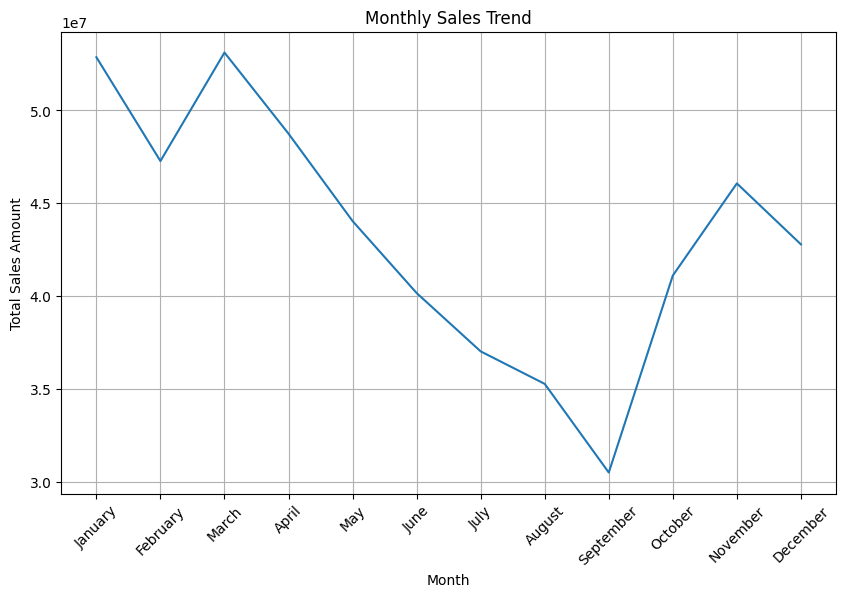

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Make sure 'month' is in the correct order
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

monthly_sales = df.groupby('month')['sales_amount'].sum().reindex(month_order)  # Ensure correct order

plt.figure(figsize=(10, 6))
sns.lineplot(x=monthly_sales.index, y=monthly_sales.values)
plt.title('Monthly Sales Trend')
plt.xlabel('Month')
plt.ylabel('Total Sales Amount')
plt.xticks(rotation=45)  # Rotate month labels for better readability
plt.grid(True)
plt.show()

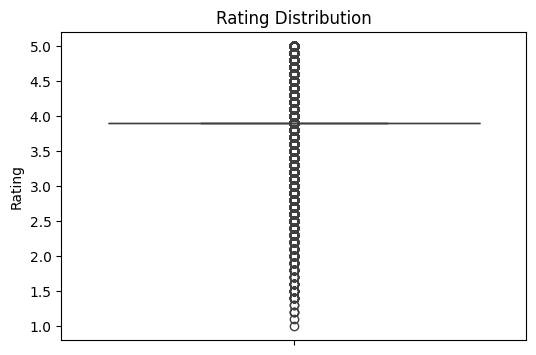

In [ ]:
plt.figure(figsize=(6, 4))
sns.boxplot(y=df['rating'])
plt.title('Rating Distribution')
plt.ylabel('Rating')
plt.show()

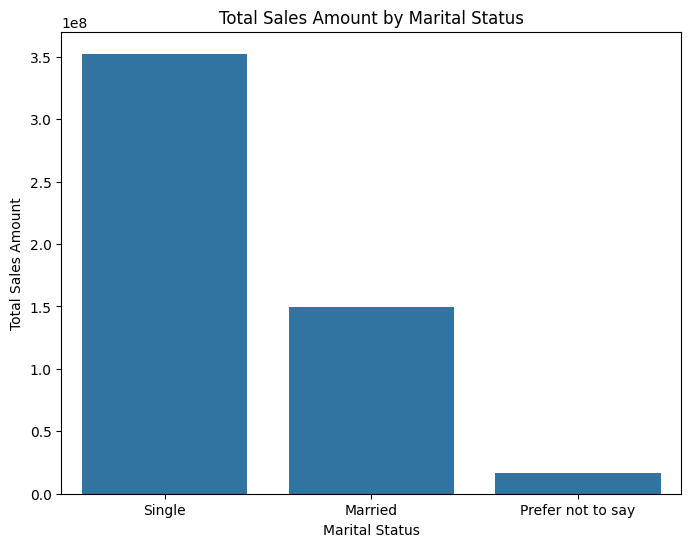

In [ ]:
marital_status_sales = df.groupby('marital_status')['sales_amount'].sum().sort_values(ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(x=marital_status_sales.index, y=marital_status_sales.values)
plt.title('Total Sales Amount by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Total Sales Amount')
plt.show()

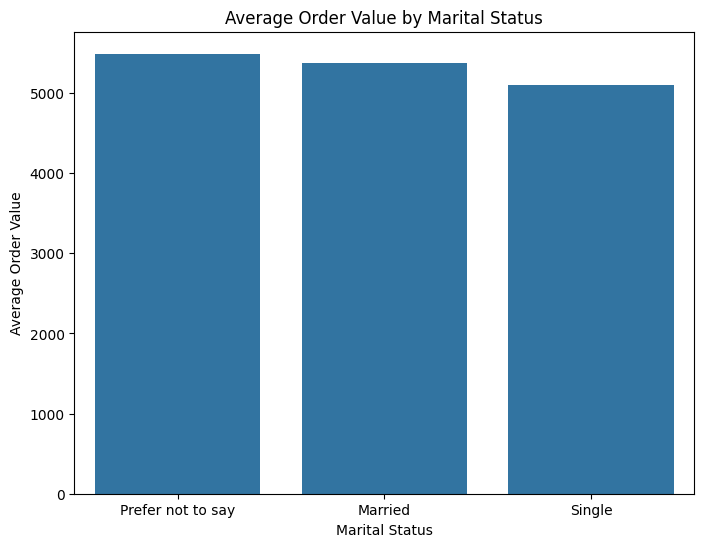

In [ ]:
marital_status_avg_sales = df.groupby('marital_status')['sales_amount'].mean().sort_values(ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(x=marital_status_avg_sales.index, y=marital_status_avg_sales.values)
plt.title('Average Order Value by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Average Order Value')
plt.show()

In [ ]:
# Ensure order_date is in datetime format
df['order_date'] = pd.to_datetime(df['order_date'])

# Total number of unique months in data
total_months = df['order_date'].dt.to_period('M').nunique()

# Group by demographics
customer_data = df.groupby(['age', 'gender', 'marital_status', 'occupation']).agg({
    'sales_amount': 'sum',
    'order_date': 'nunique'  # Unique order days (not customers yet)
}).reset_index()

# Rename for clarity
customer_data.rename(columns={'order_date': 'purchase_days'}, inplace=True)

# Calculate average order value
customer_data['avg_order_value'] = customer_data['sales_amount'] / customer_data['purchase_days']

# Monthly frequency (number of purchases per month)
customer_data['monthly_frequency'] = customer_data['purchase_days'] / total_months

# CLV formula: AOV × Monthly Frequency × Lifespan (2 years = 24 months)
customer_data['clv'] = customer_data['avg_order_value'] * customer_data['monthly_frequency'] * 24

# Output
print("Average CLV: ₹", round(customer_data['clv'].mean(), 2))
print("\nTop CLV by Customer Segment:")
print(customer_data.groupby(['gender', 'marital_status'])['clv'].mean().sort_values(ascending=False).head())


Average CLV: ₹ 4240538.89

Top CLV by Customer Segment:
gender  marital_status   
Male    Single               7.111465e+06
Female  Single               5.632161e+06
Male    Married              2.762749e+06
Female  Married              2.534673e+06
Male    Prefer not to say    1.843796e+06
Name: clv, dtype: float64


Average CLV: ₹ 4240538.89

Top CLV by Customer Segment:
gender  marital_status   
Male    Single               7.111465e+06
Female  Single               5.632161e+06
Male    Married              2.762749e+06
Female  Married              2.534673e+06
Male    Prefer not to say    1.843796e+06
Name: clv, dtype: float64


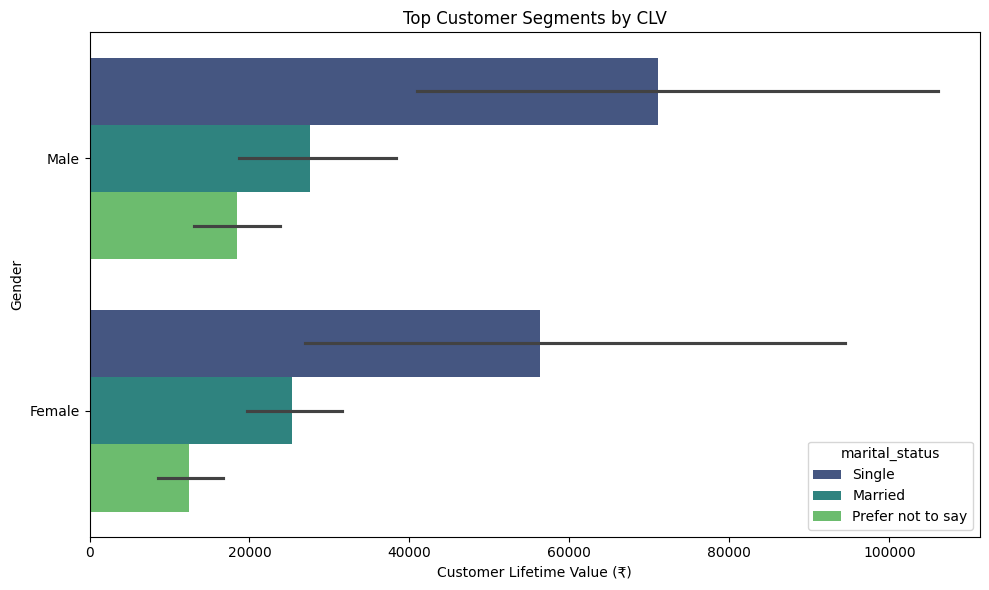

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure order_date is in datetime format
df['order_date'] = pd.to_datetime(df['order_date'])

# Total number of unique months in data
total_months = df['order_date'].dt.to_period('M').nunique()

# Group by demographics
customer_data = df.groupby(['age', 'gender', 'marital_status', 'occupation']).agg({
    'sales_amount': 'sum',
    'order_date': 'nunique'  # Unique order days
}).reset_index()

# Rename for clarity
customer_data.rename(columns={'order_date': 'purchase_days'}, inplace=True)

# Calculate average order value
customer_data['avg_order_value'] = customer_data['sales_amount'] / customer_data['purchase_days']

# Monthly frequency (number of purchases per month)
customer_data['monthly_frequency'] = customer_data['purchase_days'] / total_months

# CLV formula: AOV × Monthly Frequency × Lifespan (2 years = 24 months)
customer_data['clv'] = customer_data['avg_order_value'] * customer_data['monthly_frequency'] * 24

# Output average CLV
average_clv = customer_data['clv'].mean()
print("Average CLV: ₹", round(average_clv, 2))

# Output top CLV by Customer Segment
top_segments = customer_data.groupby(['gender', 'marital_status'])['clv'].mean().sort_values(ascending=False).head(5)
print("\nTop CLV by Customer Segment:")
print(top_segments)

# Optional: Normalize if the CLV is unusually high (you can adjust this scaling factor)
scaling_factor = 0.01  # Adjust based on real unit scale if necessary
customer_data['clv'] = customer_data['clv'] * scaling_factor

# Visualize CLV by Customer Segment
plt.figure(figsize=(10, 6))
sns.barplot(data=customer_data, x='clv', y='gender', hue='marital_status', palette='viridis')
plt.title('Top Customer Segments by CLV')
plt.xlabel('Customer Lifetime Value (₹)')
plt.ylabel('Gender')
plt.tight_layout()
plt.show()



In [ ]:
# AOV by city and cuisine
aov_analysis = df.groupby(['city', 'cuisine']).agg({
    'sales_amount': 'mean',
    'order_date': 'count'
}).reset_index()

aov_analysis.rename(columns={'sales_amount': 'aov', 'order_date': 'order_count'}, inplace=True)
aov_analysis = aov_analysis.sort_values('aov', ascending=False)

print("Overall AOV: ₹", df['sales_amount'].mean())
print("Top 5 City-Cuisine Combinations by AOV:")
print(aov_analysis.head(5))

Overall AOV: ₹ 5189.35947
Top 5 City-Cuisine Combinations by AOV:
                            city          cuisine        aov  order_count
11140      Connaught Place,Delhi         Desserts  1228148.0            1
9793        Chandkheda,Ahmedabad  Waffle,Desserts   996102.0            1
31539      Navrangpura,Ahmedabad   Chinese,Pizzas   970130.0            1
15839        Ghatlodia,Ahmedabad           Sweets   970130.0            1
13473  Electronic City,Bangalore   Pizzas,Chinese   760255.0            1


In [ ]:
# Create a comprehensive restaurant performance index
restaurant_performance = df.groupby('name').agg({
    'sales_amount': ['sum', 'mean'],
    'order_date': 'nunique',
    'rating': 'mean'
}).reset_index()

restaurant_performance.columns = ['name', 'total_revenue', 'avg_order_value', 'order_days', 'avg_rating']

# Calculate order frequency (orders per day)
date_range = (df['order_date'].max() - df['order_date'].min()).days + 1
restaurant_performance['daily_order_frequency'] = restaurant_performance['order_days'] / date_range

# Create a weighted performance index (revenue 40%, rating 30%, frequency 30%)
max_revenue = restaurant_performance['total_revenue'].max()
restaurant_performance['revenue_score'] = restaurant_performance['total_revenue'] / max_revenue * 0.4
restaurant_performance['rating_score'] = restaurant_performance['avg_rating'] / 5 * 0.3
restaurant_performance['frequency_score'] = restaurant_performance['daily_order_frequency'] / restaurant_performance['daily_order_frequency'].max() * 0.3

restaurant_performance['performance_index'] = (restaurant_performance['revenue_score'] +
                                             restaurant_performance['rating_score'] +
                                             restaurant_performance['frequency_score'])

print("Top 10 Restaurants by Performance Index:")
print(restaurant_performance.sort_values('performance_index', ascending=False).head(10)[['name', 'total_revenue', 'avg_rating', 'performance_index']])

Top 10 Restaurants by Performance Index:
                                                  name  total_revenue  \
19754                                   Domino's Pizza        1201303   
50312                                        Pizza Hut        1236502   
63936                  Sweet Truth - Cake and Desserts        1332118   
36040                    Kouzina Kafe - The Food Court        1774735   
36515  Kwality Walls Frozen Dessert and Ice Cream Shop         829213   
33565                                              KFC         828399   
30124                                    Huber & Holly        1618439   
22308                                     Firangi Bake         931196   
8160                                    Baskin Robbins         663026   
68444                                    The Good Bowl         928219   

       avg_rating  performance_index  
19754    4.192416           0.822302  
50312    3.655933           0.722405  
63936    4.131358           0.699404  

In [ ]:
# Geographic analysis by state, city, and available pincodes
geo_analysis = df.groupby(['state', 'city']).agg({
    'sales_amount': ['sum', 'mean'],
    'order_date': 'nunique',
    'rating': 'mean',
    'name': 'nunique'  # Number of unique restaurants
}).reset_index()

geo_analysis.columns = ['state', 'city', 'total_revenue', 'aov', 'active_days', 'avg_rating', 'restaurant_count']

# Calculate orders per restaurant
geo_analysis['orders_per_restaurant'] = df.groupby(['state', 'city']).size().values / geo_analysis['restaurant_count']

# Calculate revenue per capita (proxy using restaurant density)
geo_analysis['revenue_density'] = geo_analysis['total_revenue'] / geo_analysis['restaurant_count']

print("Top Performing Cities by Revenue:")
print(geo_analysis.sort_values('total_revenue', ascending=False).head(5))

print("\nCities with Highest Average Order Value:")
print(geo_analysis.sort_values('aov', ascending=False).head(5))

# Pincode level analysis where available
if df['pincode'].notna().sum() > 0:
    pincode_analysis = df[df['pincode'].notna()].groupby('pincode').agg({
        'sales_amount': ['sum', 'mean', 'count'],
        'name': 'nunique'
    }).reset_index()

    pincode_analysis.columns = ['pincode', 'total_revenue', 'aov', 'order_count', 'restaurant_count']
    print("\nTop Performing Pincodes:")
    print(pincode_analysis.sort_values('total_revenue', ascending=False).head(5))

Top Performing Cities by Revenue:
               state                       city  total_revenue           aov  \
2378       Karnataka  Electronic City,Bangalore        5672707  28363.535000   
4384  Uttar Pradesh           Indirapuram,Delhi        2868235  10864.526515   
1335          Delhi                Rohini,Delhi        1727951  16614.913462   
2422      Karnataka   Electronic City,Bangalore        1714435  25976.287879   
1631        Gujarat        Chandkheda,Ahmedabad        1703749  46047.270270   

      active_days  avg_rating  restaurant_count  orders_per_restaurant  \
2378          175    3.941381               200                    1.0   
4384          204    3.918572               264                    1.0   
1335           98    3.895647               104                    1.0   
2422           61    3.894959                66                    1.0   
1631           34    3.883380                37                    1.0   

      revenue_density  
2378     28363.5

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


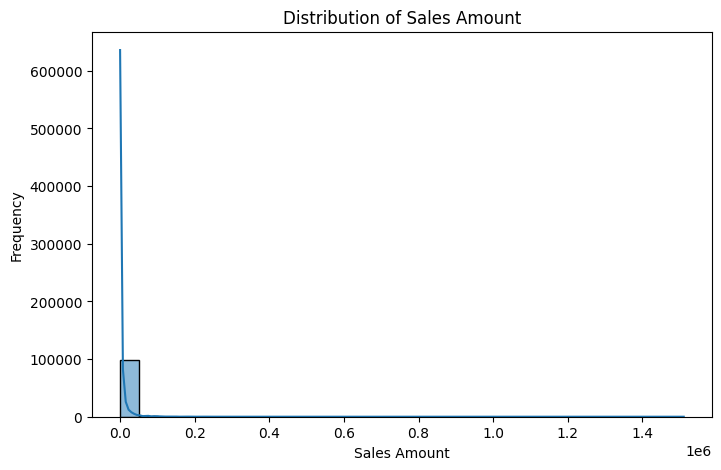

In [ ]:
# Step 2: Exploratory Data Analysis (EDA)
# Distribution of sales_amount
plt.figure(figsize=(8, 5))
sns.histplot(df['sales_amount'], bins=30, kde=True)
plt.title('Distribution of Sales Amount')
plt.xlabel('Sales Amount')
plt.ylabel('Frequency')
plt.savefig('sales_amount_distribution.png')
plt.show()

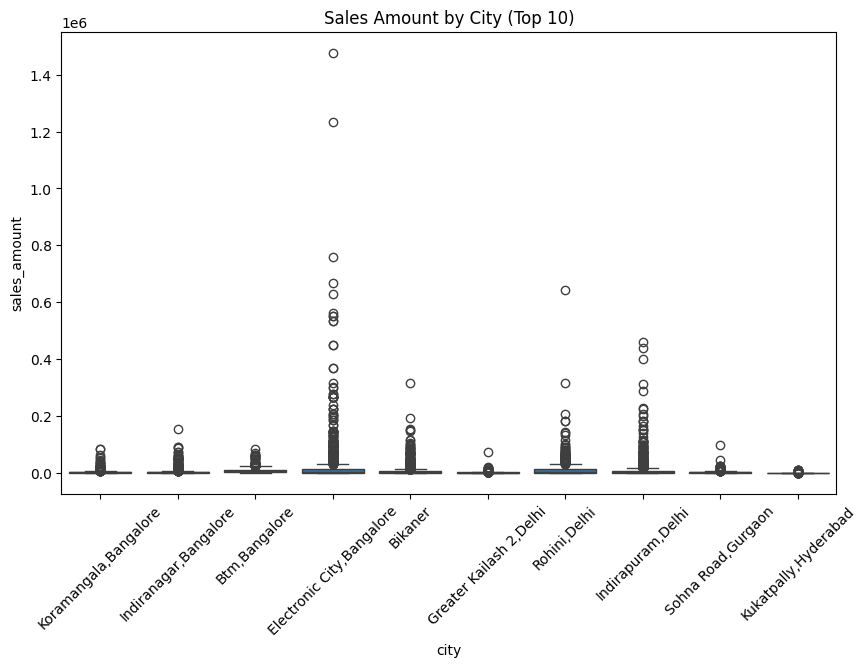

In [ ]:
# Sales by city (top 10 cities by order count)
top_cities = df['city'].value_counts().index[:10]
plt.figure(figsize=(10, 6))
sns.boxplot(x='city', y='sales_amount', data=df[df['city'].isin(top_cities)])
plt.title('Sales Amount by City (Top 10)')
plt.xticks(rotation=45)
plt.savefig('sales_by_city.png')
plt.show()

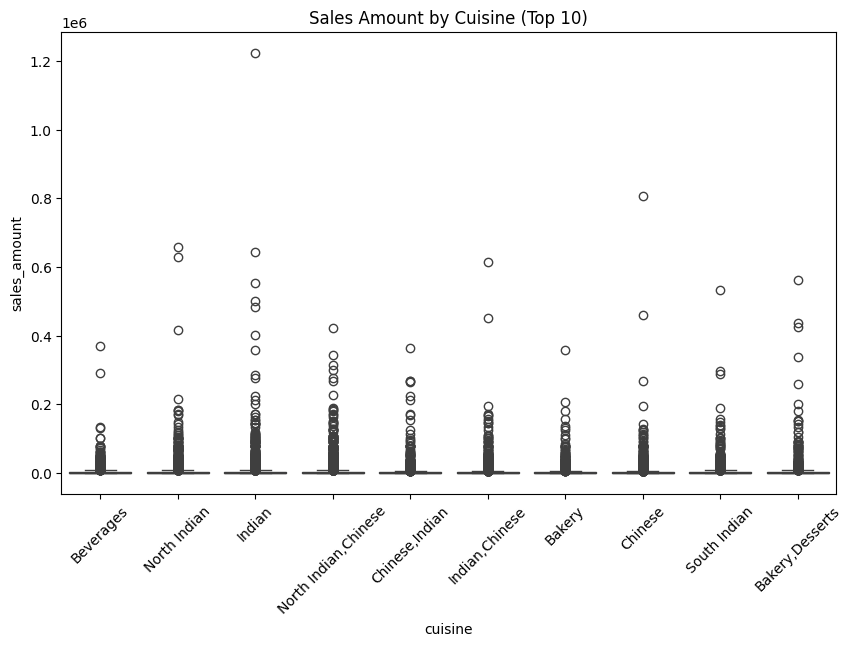

In [ ]:
# Sales by cuisine (top 10 cuisines by order count)
top_cuisines = df['cuisine'].value_counts().index[:10]
plt.figure(figsize=(10, 6))
sns.boxplot(x='cuisine', y='sales_amount', data=df[df['cuisine'].isin(top_cuisines)])
plt.title('Sales Amount by Cuisine (Top 10)')
plt.xticks(rotation=45)
plt.savefig('sales_by_cuisine.png')
plt.show()


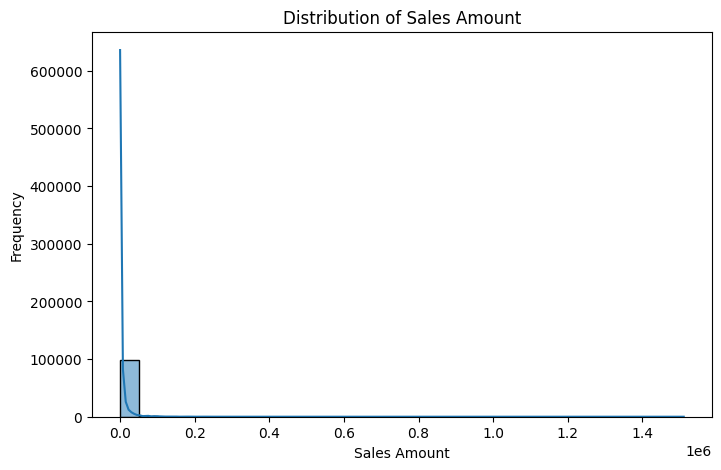

Part 2.1: Saved sales_amount distribution plot


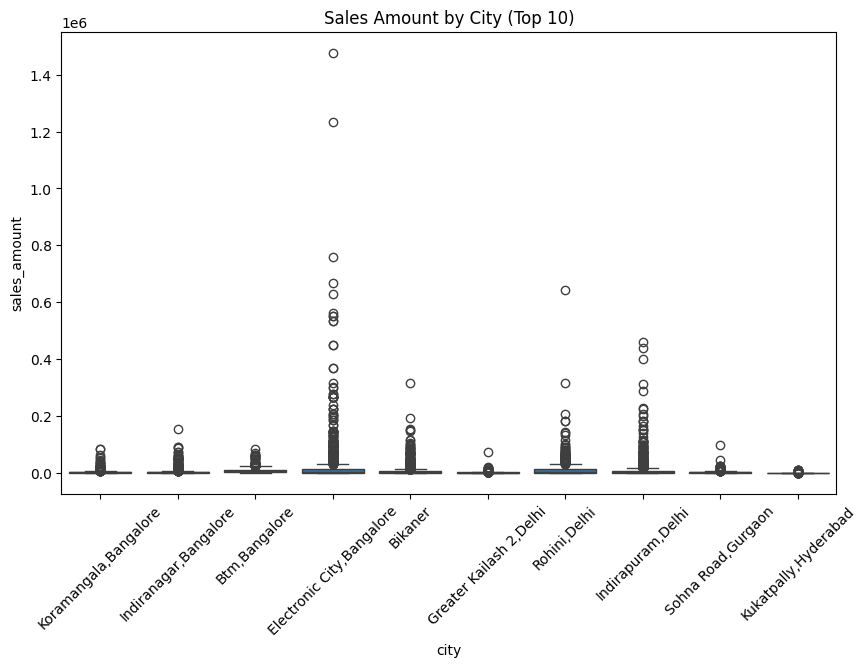

Part 2.2: Saved sales by city plot


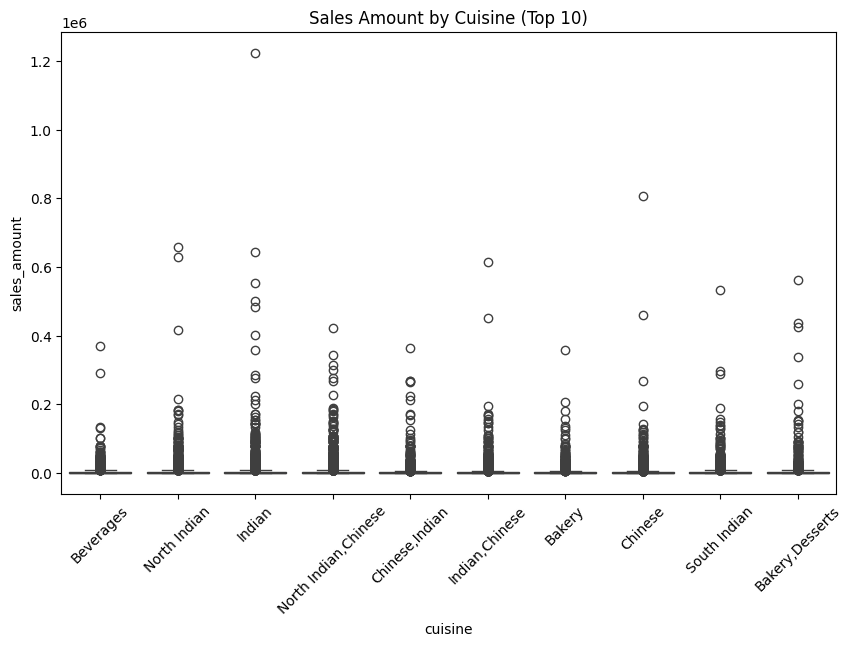

Part 2.3: Saved sales by cuisine plot


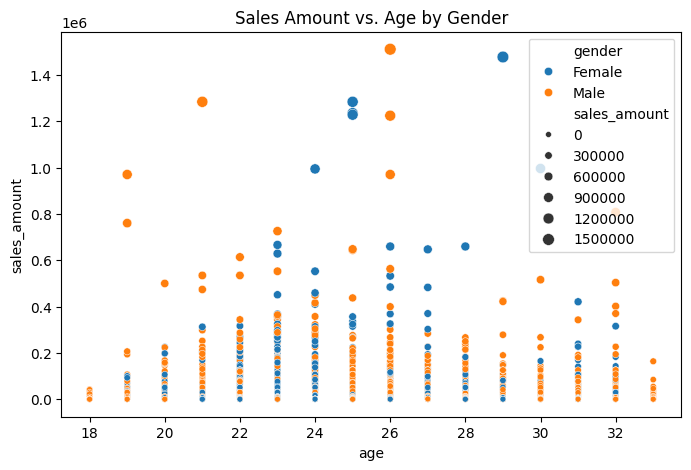

Part 2.4: Saved sales by age and gender plot


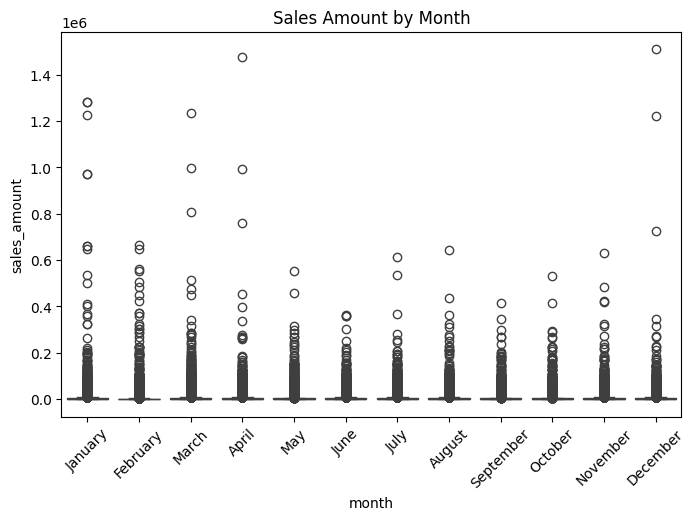

Part 2.5: Saved sales by month plot


In [ ]:



# 2.1: Distribution of sales_amount
plt.figure(figsize=(8, 5))
sns.histplot(df['sales_amount'], bins=30, kde=True)
plt.title('Distribution of Sales Amount')
plt.xlabel('Sales Amount')
plt.ylabel('Frequency')
plt.savefig('sales_amount_distribution.png')
plt.show()
print("Part 2.1: Saved sales_amount distribution plot")

# 2.2: Sales by city (top 10 cities by order count)
top_cities = df['city'].value_counts().index[:10]
plt.figure(figsize=(10, 6))
sns.boxplot(x='city', y='sales_amount', data=df[df['city'].isin(top_cities)])
plt.title('Sales Amount by City (Top 10)')
plt.xticks(rotation=45)
plt.savefig('sales_by_city.png')
plt.show()
print("Part 2.2: Saved sales by city plot")

# 2.3: Sales by cuisine (top 10 cuisines by order count)
top_cuisines = df['cuisine'].value_counts().index[:10]
plt.figure(figsize=(10, 6))
sns.boxplot(x='cuisine', y='sales_amount', data=df[df['cuisine'].isin(top_cuisines)])
plt.title('Sales Amount by Cuisine (Top 10)')
plt.xticks(rotation=45)
plt.savefig('sales_by_cuisine.png')
plt.show()
print("Part 2.3: Saved sales by cuisine plot")

# 2.4: Sales by age and gender
plt.figure(figsize=(8, 5))
sns.scatterplot(x='age', y='sales_amount', hue='gender', size='sales_amount', data=df)
plt.title('Sales Amount vs. Age by Gender')
plt.savefig('sales_by_age_gender.png')
plt.show()
print("Part 2.4: Saved sales by age and gender plot")

# 2.5: Sales by month
plt.figure(figsize=(8, 5))
sns.boxplot(x='month', y='sales_amount', data=df, order=['January', 'February', 'March', 'April', 'May', 'June',
                                                        'July', 'August', 'September', 'October', 'November', 'December'])
plt.title('Sales Amount by Month')
plt.xticks(rotation=45)
plt.savefig('sales_by_month.png')
plt.show()
print("Part 2.5: Saved sales by month plot")

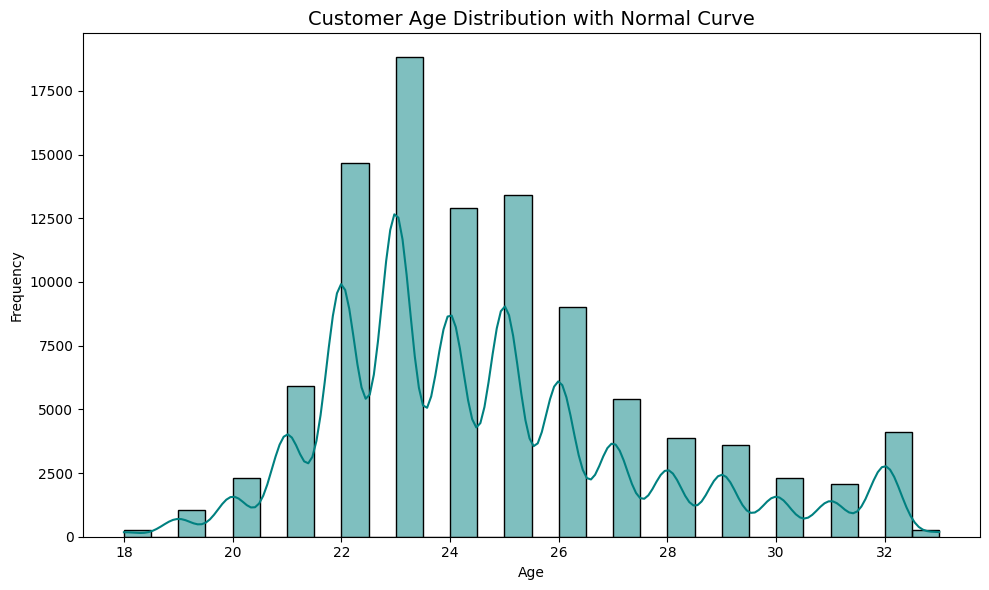

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(df['age'], kde=True, bins=30, color='teal')
plt.title('Customer Age Distribution with Normal Curve', fontsize=14)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


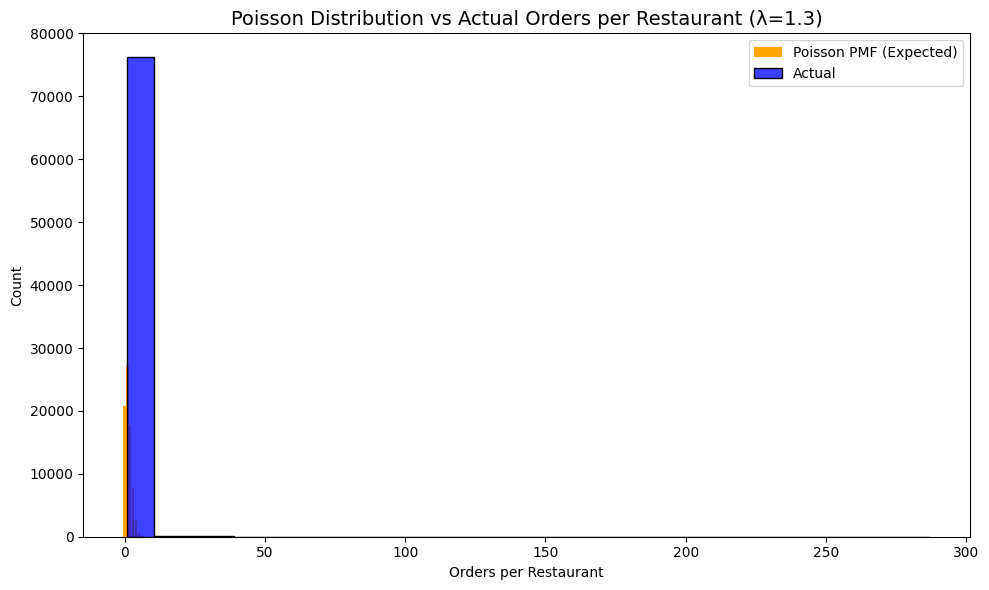

In [ ]:
from scipy.stats import poisson
import numpy as np

# Count orders per restaurant
orders_per_restaurant = df['name'].value_counts()
mu = orders_per_restaurant.mean()
x = np.arange(0, int(orders_per_restaurant.max()))

plt.figure(figsize=(10, 6))
plt.bar(x, poisson.pmf(x, mu) * len(orders_per_restaurant), color='orange', label='Poisson PMF (Expected)')
sns.histplot(orders_per_restaurant, bins=30, color='blue', stat='count', label='Actual', kde=False)
plt.title(f'Poisson Distribution vs Actual Orders per Restaurant (λ={mu:.1f})', fontsize=14)
plt.xlabel('Orders per Restaurant')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()


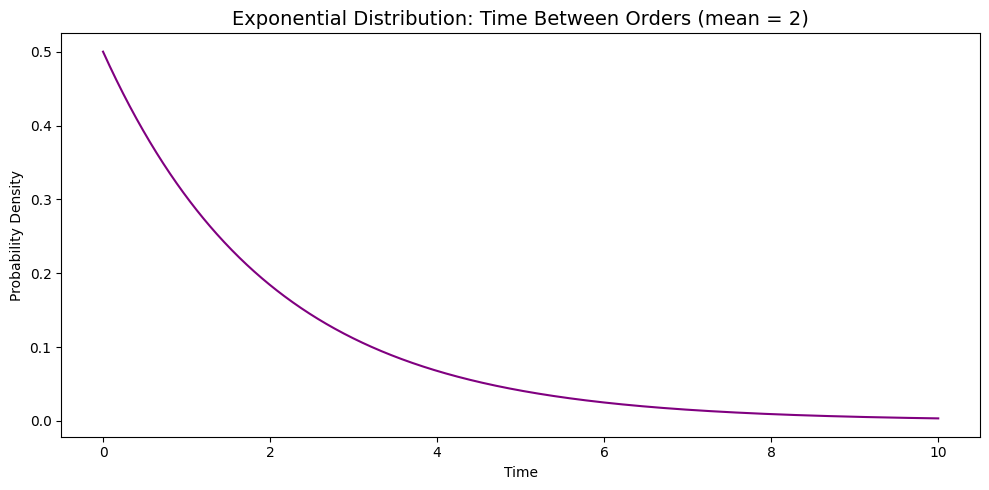

In [ ]:
from scipy.stats import expon

x = np.linspace(0, 10, 1000)
scale = 2  # average time between orders
y = expon.pdf(x, scale=scale)

plt.figure(figsize=(10, 5))
plt.plot(x, y, color='purple')
plt.title('Exponential Distribution: Time Between Orders (mean = 2)', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Probability Density')
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


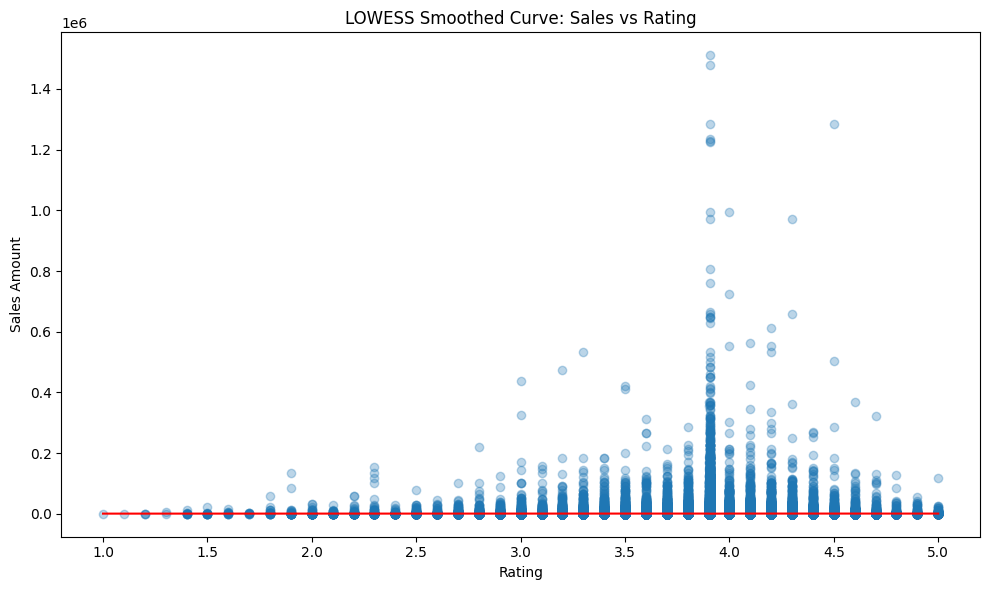

In [ ]:
import statsmodels.api as sm

# LOWESS smoothing
lowess = sm.nonparametric.lowess
smoothed = lowess(df['sales_amount'], df['rating'], frac=0.2)

plt.figure(figsize=(10, 6))
plt.scatter(df['rating'], df['sales_amount'], alpha=0.3)
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red')
plt.title('LOWESS Smoothed Curve: Sales vs Rating')
plt.xlabel('Rating')
plt.ylabel('Sales Amount')
plt.tight_layout()
plt.show()


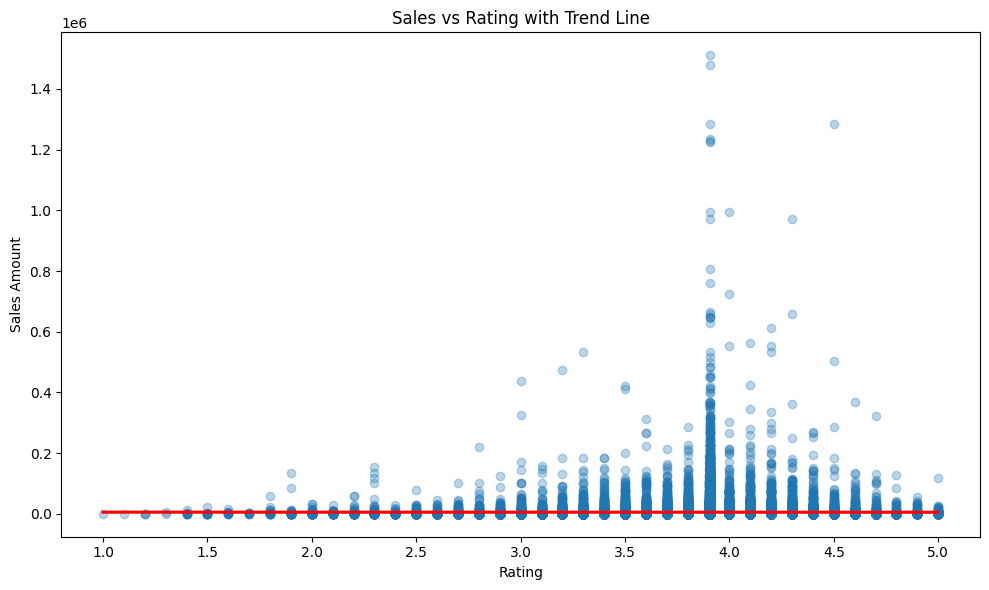

In [ ]:
# Scatter plot with a regression curve
plt.figure(figsize=(10, 6))
sns.regplot(data=df, x='rating', y='sales_amount', scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
plt.title('Sales vs Rating with Trend Line')
plt.xlabel('Rating')
plt.ylabel('Sales Amount')
plt.tight_layout()
plt.show()


In [ ]:
top_cities = df.groupby('city')['sales_amount'].sum().sort_values(ascending=False).head(3).index.tolist()
print(top_cities)


['Electronic City,Bangalore', 'Malviya Nagar,Delhi', 'Vastrapur,Ahmedabad']


In [ ]:
top_cities_df = df[df['city'].isin(top_cities)]


In [ ]:
monthly_sales = (
    top_cities_df.groupby(['city', 'month', 'year'])['sales_amount']
    .sum()
    .reset_index()
)

# Convert month-year to datetime for forecasting
monthly_sales['date'] = pd.to_datetime(monthly_sales['month'] + ' ' + monthly_sales['year'].astype(str))
monthly_sales = monthly_sales.sort_values('date')


<ipython-input-6-c13c1e81e0ec>:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  monthly_sales['date'] = pd.to_datetime(monthly_sales['month'] + ' ' + monthly_sales['year'].astype(str))


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/48e5nnpd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/x_0pn46f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50457', 'data', 'file=/tmp/tmp2u4jw_5u/48e5nnpd.json', 'init=/tmp/tmp2u4jw_5u/x_0pn46f.json', 'output', 'file=/tmp/tmp2u4jw_5u/prophet_modelk2ycgwcd/prophet_model-20250506071859.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
07:18:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:18:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


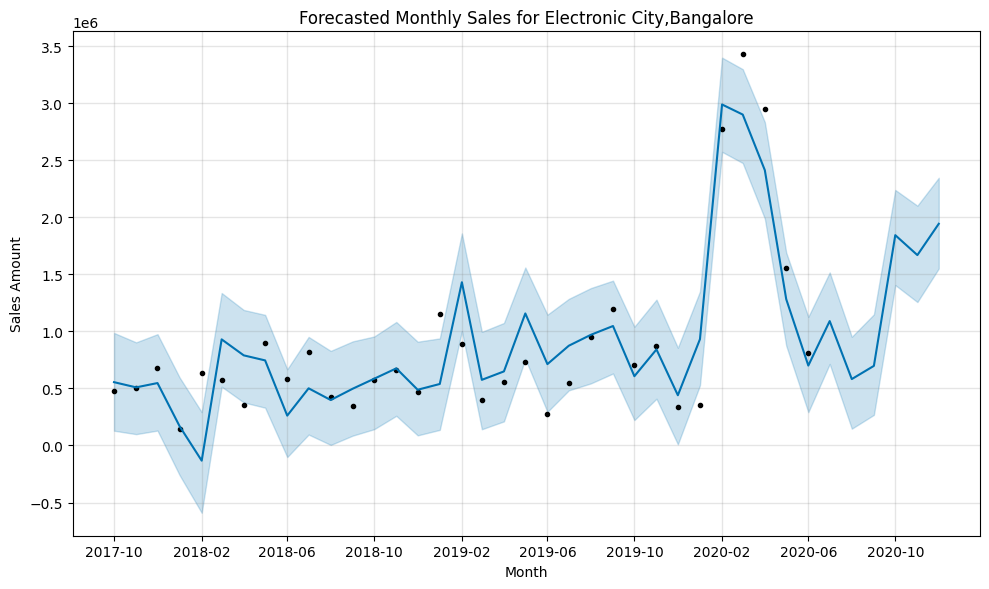

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/tjb46edg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/76uzvq17.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96514', 'data', 'file=/tmp/tmp2u4jw_5u/tjb46edg.json', 'init=/tmp/tmp2u4jw_5u/76uzvq17.json', 'output', 'file=/tmp/tmp2u4jw_5u/prophet_model2iqqksx5/prophet_model-20250506071900.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
07:19:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:19:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


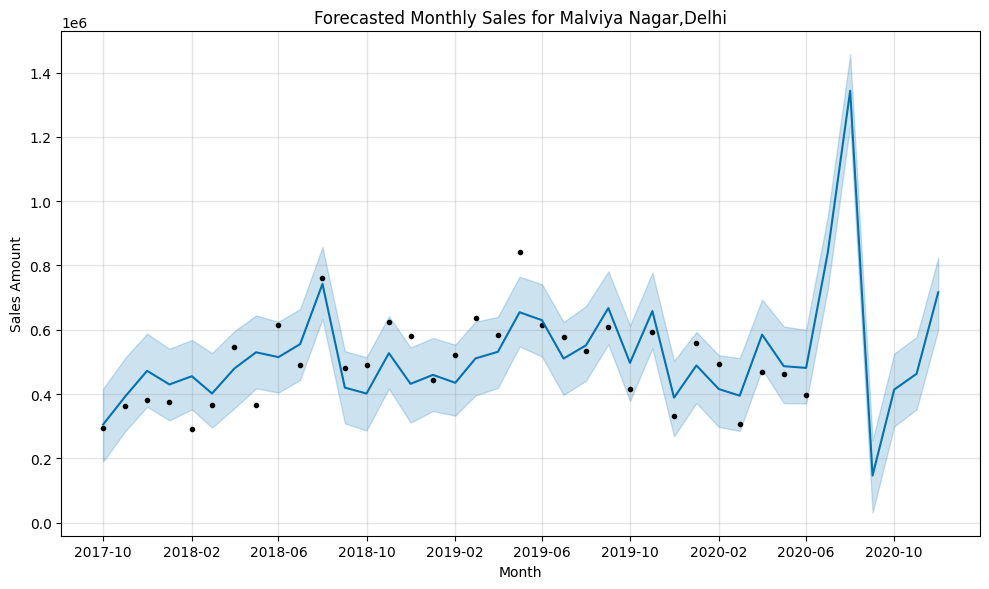

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 21.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/0m7nnyt6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2u4jw_5u/53we9q8f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78244', 'data', 'file=/tmp/tmp2u4jw_5u/0m7nnyt6.json', 'init=/tmp/tmp2u4jw_5u/53we9q8f.json', 'output', 'file=/tmp/tmp2u4jw_5u/prophet_modeljybbnnx4/prophet_model-20250506071901.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
07:19:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:19:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:

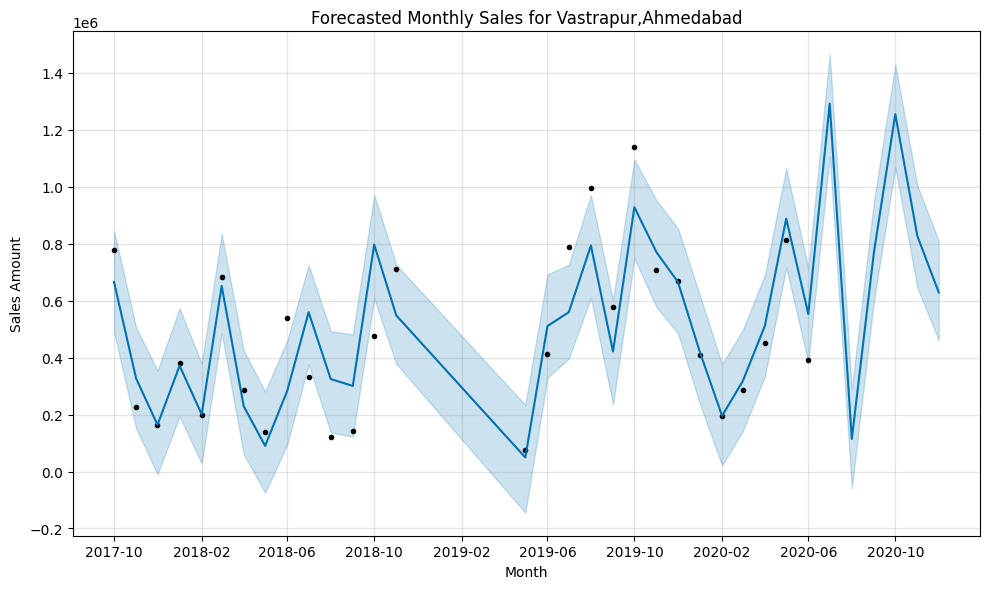

In [ ]:
from prophet import Prophet
import matplotlib.pyplot as plt

for city in top_cities:
    city_data = monthly_sales[monthly_sales['city'] == city][['date', 'sales_amount']]
    city_data = city_data.rename(columns={'date': 'ds', 'sales_amount': 'y'})

    model = Prophet()
    model.fit(city_data)

    future = model.make_future_dataframe(periods=6, freq='MS')  # next 6 months
    forecast = model.predict(future)

    # Plot
    model.plot(forecast)
    plt.title(f"Forecasted Monthly Sales for {city}")
    plt.xlabel("Month")
    plt.ylabel("Sales Amount")
    plt.tight_layout()
    plt.show()


<ipython-input-10-97cdd0c997e5>:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


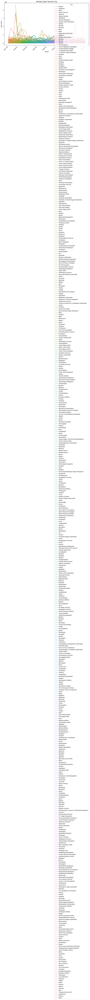

In [ ]:

import seaborn as sns

# Step 1: Convert date and extract month
df['order_date'] = pd.to_datetime(df['order_date'])
df['month_year'] = df['order_date'].dt.to_period('M')

# Step 2: Aggregate monthly sales by city
monthly_sales = df.groupby(['month_year', 'city'])['sales_amount'].sum().reset_index()
monthly_sales['month_year'] = monthly_sales['month_year'].dt.to_timestamp()

# Step 3: Plot sales trends
plt.figure(figsize=(12,6))
sns.lineplot(data=monthly_sales, x='month_year', y='sales_amount', hue='city')
plt.title("Monthly Sales Trend by City")
plt.xlabel("Month")
plt.ylabel("Total Sales")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
from prophet import Prophet

# Choose one city for example (extend later to others)
city_df = monthly_sales[monthly_sales['city'] == 'Mumbai'][['month_year', 'sales_amount']]
city_df.rename(columns={'month_year': 'ds', 'sales_amount': 'y'}, inplace=True)

# Create and fit model
model = Prophet()
model.fit(city_df)

# Make future dataframe
future = model.make_future_dataframe(periods=6, freq='M')  # next 6 months
forecast = model.predict(future)

# Plot forecast
model.plot(forecast)
plt.title("Sales Forecast for Mumbai")
plt.show()


ValueError: Dataframe has less than 2 non-NaN rows.

Top 3 Cuisines in Each City:
                         city               cuisine  sales_amount  rank
60     Abids & Koti,Hyderabad                Sweets         43449   1.0
56     Abids & Koti,Hyderabad          South Indian         28884   2.0
5      Abids & Koti,Hyderabad    Beverages,Desserts         26949   3.0
81                     Abohar                Indian        387061   1.0
88                     Abohar  North Indian,Chinese        126629   2.0
...                       ...                   ...           ...   ...
41367  Yeshwanthpur,Bangalore        Indian,Arabian         63926   2.0
41369  Yeshwanthpur,Bangalore        Indian,Chinese         63860   3.0
41507     Zirakpur,Chandigarh                Indian        208712   1.0
41537     Zirakpur,Chandigarh          North Indian        119837   2.0
41554     Zirakpur,Chandigarh   North Indian,Snacks        106004   3.0

[1538 rows x 4 columns]


<ipython-input-12-31ee1d4b7274>:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


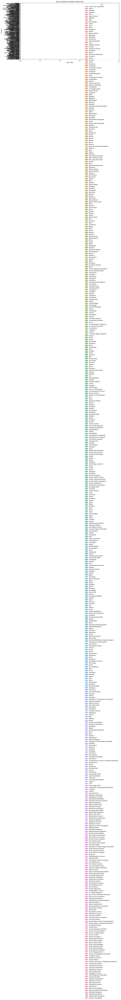

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Group by city and cuisine, then calculate total sales
city_cuisine_sales = df.groupby(['city', 'cuisine'])['sales_amount'].sum().reset_index()

# Step 2: Rank cuisines within each city
city_cuisine_sales['rank'] = city_cuisine_sales.groupby('city')['sales_amount'].rank(ascending=False)

# Step 3: Filter top 3 cuisines per city
top_cuisines = city_cuisine_sales[city_cuisine_sales['rank'] <= 3].sort_values(['city', 'rank'])

print("Top 3 Cuisines in Each City:")
print(top_cuisines)

# Step 4: Visualize
plt.figure(figsize=(14, 8))
sns.barplot(data=top_cuisines, x='sales_amount', y='cuisine', hue='city')
plt.title('Top 3 Cuisines by Sales in Each City')
plt.xlabel('Total Sales')
plt.ylabel('Cuisine')
plt.legend(title='City')
plt.tight_layout()
plt.show()


<ipython-input-14-f70504b5191e>:26: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='City')


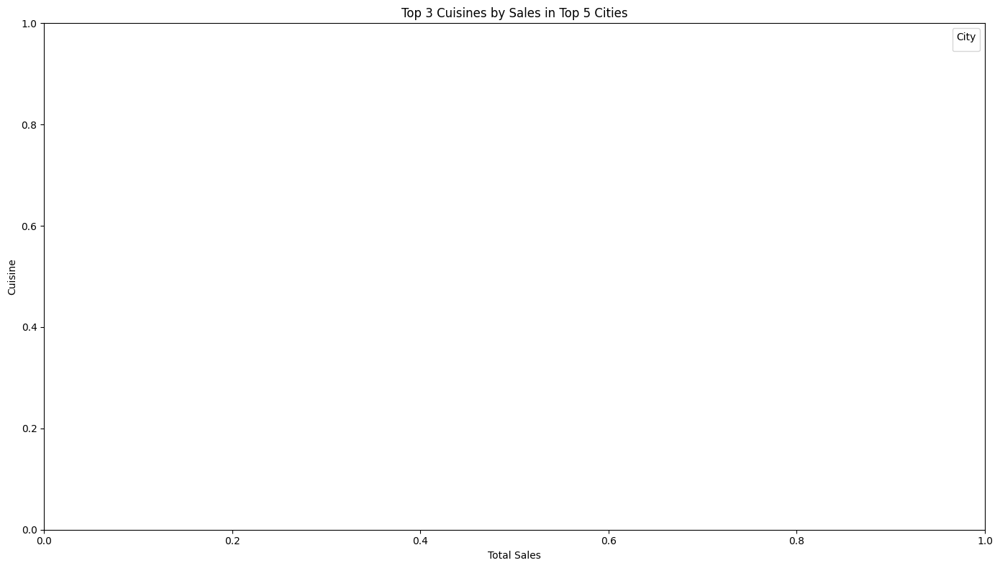

Top 3 Cuisines in Each of the Top 5 Cities:
Empty DataFrame
Columns: [city, cuisine, sales_amount]
Index: []


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Choose your top 5 cities (you can change these names)
top_5_cities = ['Mumbai', 'Delhi', 'Bangalore', 'Hyderabad', 'Kolkata']

# Filter the dataframe to include only those 5 cities
df_top5 = df[df['city'].isin(top_5_cities)]

# Step 1: Group by city and cuisine to calculate total sales
city_cuisine_sales = df_top5.groupby(['city', 'cuisine'])['sales_amount'].sum().reset_index()

# Step 2: Rank cuisines within each city
city_cuisine_sales['rank'] = city_cuisine_sales.groupby('city')['sales_amount'].rank(ascending=False)

# Step 3: Filter top 3 cuisines per city
top_cuisines = city_cuisine_sales[city_cuisine_sales['rank'] <= 3].sort_values(['city', 'rank'])

# Step 4: Visualization
plt.figure(figsize=(14, 8))
sns.barplot(data=top_cuisines, x='sales_amount', y='cuisine', hue='city')
plt.title('Top 3 Cuisines by Sales in Top 5 Cities')
plt.xlabel('Total Sales')
plt.ylabel('Cuisine')
plt.legend(title='City')
plt.tight_layout()
plt.show()

# Display result
print("Top 3 Cuisines in Each of the Top 5 Cities:")
print(top_cuisines[['city', 'cuisine', 'sales_amount']])


In [ ]:
import pandas as pd

# Assuming df is available from Part 1
# If running independently, load and prepare the dataset:
# df = pd.read_csv('foodfast_orders.csv')[['city', 'cuisine', 'sales_amount', 'order_date']]
# df['order_date'] = pd.to_datetime(df['order_date'])

# 3.1: Filter data for recent trends (e.g., last year, assuming 2024 is the latest year)
latest_year = df['order_date'].dt.year.max()
df_recent = df[df['order_date'].dt.year == latest_year]
print(f"Part 3.1: Filtered data for year {latest_year}, {len(df_recent)} orders")

# 3.2: Group by city and cuisine to calculate average sales_amount and order count
cuisine_by_city = df_recent.groupby(['city', 'cuisine']).agg({
    'sales_amount': ['mean', 'count']
}).reset_index()
cuisine_by_city.columns = ['city', 'cuisine', 'avg_sales_amount', 'order_count']

# Filter for cities with sufficient orders (e.g., at least 100 orders total)
city_order_counts = df_recent['city'].value_counts()
valid_cities = city_order_counts[city_order_counts >= 100].index
cuisine_by_city = cuisine_by_city[cuisine_by_city['city'].isin(valid_cities)]

# 3.3: Identify top cuisines per city (top 3 by avg_sales_amount, with at least 10 orders)
top_cuisines_by_city = cuisine_by_city[cuisine_by_city['order_count'] >= 10]
top_cuisines_by_city = top_cuisines_by_city.groupby('city').apply(
    lambda x: x.nlargest(3, 'avg_sales_amount')
).reset_index(drop=True)

# Sort by city and avg_sales_amount
top_cuisines_by_city = top_cuisines_by_city.sort_values(['city', 'avg_sales_amount'], ascending=[True, False])

# 3.4: Save results to CSV
top_cuisines_by_city.to_csv('top_cuisines_by_city.csv', index=False)
print("Part 3.4: Saved top cuisines by city to 'top_cuisines_by_city.csv'")

# 3.5: Display top cuisines for top 5 cities (by order count)
top_5_cities = valid_cities[:5]
print("\nPart 3.5: Top 3 Cuisines by Average Sales Amount for Top 5 Cities")
for city in top_5_cities:
    city_data = top_cuisines_by_city[top_cuisines_by_city['city'] == city]
    print(f"\n{city}:")
    print(city_data[['cuisine', 'avg_sales_amount', 'order_count']])

Part 3.1: Filtered data for year 2020, 14357 orders
Part 3.4: Saved top cuisines by city to 'top_cuisines_by_city.csv'

Part 3.5: Top 3 Cuisines by Average Sales Amount for Top 5 Cities

Gtb Nagar,Delhi:
      cuisine  avg_sales_amount  order_count
38  Beverages       9016.166667           12
39     Bakery       6349.250000           12
40     Indian       5344.125000           48

Porur,Chennai:
                      cuisine  avg_sales_amount  order_count
62             Indian,Chinese       3686.083333           12
63                  Beverages       2449.454545           11
64  South Indian,North Indian       2283.300000           10

Faridabad:
                 cuisine  avg_sales_amount  order_count
26          North Indian       7160.125000           16
27  North Indian,Chinese       5839.083333           48
28                Pizzas       5759.000000           14

Jp Nagar,Bangalore:
                 cuisine  avg_sales_amount  order_count
43                Indian       5965.857143 

<ipython-input-15-cdd0cb956f1a>:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_cuisines_by_city = top_cuisines_by_city.groupby('city').apply(
